In [1]:
from time import time
import keras
from keras.models import Sequential,Model
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
from keras.callbacks import TensorBoard
import cv2
import os
from tqdm import tqdm
import numpy as np
import random
import matplotlib.pyplot as plt
from keras import optimizers
from keras import applications

/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
def create_label(number,vec_size):
    a=np.zeros((vec_size,1))
    a[number]=1
    return np.array(a)

def create_dataset_acs(IMG_SIZE=50,label_list=list(range(15))):
    #total images in training dataset=71094
    # mean image size 206,164
    DATASET_DIR='/home/vsl5/Desktop/udit/datasets'
    DATASET_FILE_PATH='fashion-data2/train.txt'

    train_file=open(os.path.join(DATASET_DIR,DATASET_FILE_PATH),'r')
    train_file_paths=train_file.read().split('\n')
    train_file.close()

    FILE_PATH='fashion-data2/labels.json'
    label_file=open(os.path.join(DATASET_DIR,FILE_PATH),'r')
    label_read=label_file.read()
    label_file.close()

    temp1=label_read.split('\n')
    label_file.close()

    labels_dict={}
    for i in temp1[1:-2]:
        key=i.split(':')
        if int(key[0]) in label_list:
            labels_dict[int(key[0])]=key[1][:-2]

    #IMG_SIZE=50
    training_data=[]
    k=0
    for img_path in tqdm(train_file_paths[:-1]):
        k=k+1
        #img_path_full=os.path.join(DATASET_DIR+'/fashion-data/images',img_path+'.jpg')
        #img=cv2.imread(img_path_full,cv2.IMREAD_GRAYSCALE)
        #img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
        
        #print(img)
        if int(img_path[0]) in label_list:
            img_path_full=os.path.join(DATASET_DIR+'/fashion-data2/images',img_path+'.jpg')
            img=cv2.cvtColor(cv2.imread(img_path_full,cv2.IMREAD_COLOR),cv2.COLOR_BGR2RGB)
            img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
            label=create_label(int(img_path[0:2].split('/')[0]),len(label_list))
            training_data.append([np.array(img),label])
    shuffle(training_data)
    #np.save('acs_train_data_labels-{}.npy'.format(len(label_list)),training_data)
    return training_data,labels_dict

In [4]:
temp1='0/'

In [5]:
temp1[0:2]

'0/'

In [3]:
img_size=50

In [4]:
#importing data
training_data,labels_dict=create_dataset_acs(img_size)

100%|██████████| 71093/71093 [01:18<00:00, 909.44it/s]


In [5]:
#training data sanity check
print('# of training samples:',len(training_data),' shape:',training_data[0][0].shape,
      'shape_label:',training_data[0][1].shape)

# of training samples: 71093  shape: (50, 50, 3) shape_label: (15, 1)


In [7]:
#making training and validation set
train=training_data[:-3000]
val_test=training_data[-3000:]

In [8]:
#reshaping
X=np.array([np.array(i[0]) for i in train])
Y=np.array([i[1].reshape((len(labels_dict),)) for i in train])

val_test_x=np.array([np.array(i[0]) for i in val_test])
val_test_y=np.array([i[1].reshape((len(labels_dict),)) for i in val_test])

In [10]:
#importing VGG16 Network
model=applications.VGG16(include_top=False,weights='imagenet',input_shape=(img_size,img_size,3),classes=len(labels_dict))

ResourceExhaustedError: OOM when allocating tensor with shape[3,3,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[Node: block3_conv3_1/random_uniform/RandomUniform = RandomUniform[T=DT_INT32, dtype=DT_FLOAT, seed=87654321, seed2=6533900, _device="/job:localhost/replica:0/task:0/device:GPU:0"](block3_conv2_1/random_uniform/shape)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.


Caused by op 'block3_conv3_1/random_uniform/RandomUniform', defined at:
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tornado/platform/asyncio.py", line 112, in start
    self.asyncio_loop.run_forever()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/asyncio/base_events.py", line 422, in run_forever
    self._run_once()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/asyncio/base_events.py", line 1432, in _run_once
    handle._run()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/asyncio/events.py", line 145, in _run
    self._callback(*self._args)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tornado/platform/asyncio.py", line 102, in _handle_events
    handler_func(fileobj, events)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tornado/stack_context.py", line 276, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 450, in _handle_events
    self._handle_recv()
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 480, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 432, in _run_callback
    callback(*args, **kwargs)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tornado/stack_context.py", line 276, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2662, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2785, in _run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2903, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2963, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-10-22d867f61033>", line 2, in <module>
    model=applications.VGG16(include_top=False,weights='imagenet',input_shape=(img_size,img_size,3),classes=len(labels_dict))
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/applications/vgg16.py", line 128, in VGG16
    x = Conv2D(256, (3, 3), activation='relu', padding='same', name='block3_conv3')(x)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/engine/topology.py", line 592, in __call__
    self.build(input_shapes[0])
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/layers/convolutional.py", line 138, in build
    constraint=self.kernel_constraint)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/legacy/interfaces.py", line 91, in wrapper
    return func(*args, **kwargs)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/engine/topology.py", line 413, in add_weight
    weight = K.variable(initializer(shape),
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/initializers.py", line 217, in __call__
    dtype=dtype, seed=self.seed)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py", line 3832, in random_uniform
    dtype=dtype, seed=seed)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tensorflow/python/ops/random_ops.py", line 244, in random_uniform
    shape, dtype, seed=seed1, seed2=seed2)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tensorflow/python/ops/gen_random_ops.py", line 435, in _random_uniform
    name=name)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 3271, in create_op
    op_def=op_def)
  File "/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1650, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[3,3,256,256] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[Node: block3_conv3_1/random_uniform/RandomUniform = RandomUniform[T=DT_INT32, dtype=DT_FLOAT, seed=87654321, seed2=6533900, _device="/job:localhost/replica:0/task:0/device:GPU:0"](block3_conv2_1/random_uniform/shape)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.



In [9]:
#setting trainable layers
for layer in model.layers:
    layer.trainable=True
for layer in model.layers[:-5]:
    layer.trainable=False

In [10]:
#trainable weights sanity check
i=0
for layer in model.layers:
    i=i+1
    print('layer Number:',i,' setting:',layer.trainable)

layer Number: 1  setting: False
layer Number: 2  setting: False
layer Number: 3  setting: False
layer Number: 4  setting: False
layer Number: 5  setting: False
layer Number: 6  setting: False
layer Number: 7  setting: False
layer Number: 8  setting: False
layer Number: 9  setting: False
layer Number: 10  setting: False
layer Number: 11  setting: False
layer Number: 12  setting: False
layer Number: 13  setting: False
layer Number: 14  setting: False
layer Number: 15  setting: True
layer Number: 16  setting: True
layer Number: 17  setting: True
layer Number: 18  setting: True
layer Number: 19  setting: True


In [11]:
#extra FC layers
x=model.output
x=Flatten()(x)
x=Dense(1024,activation="relu")(x)
#x=Dropout(0.2)(x)
x=Dense(128,activation="relu")(x)
predictions=Dense(len(labels_dict),activation="softmax")(x)

In [12]:
#combining model and FC layers
model_final=Model(inputs=model.input,output=predictions)

/home/vsl5/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`
  


In [13]:
model_final.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100, 100, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 100, 100, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 100, 100, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 50, 50, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 50, 50, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 50, 50, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 25, 25, 128)       0         
__________

In [14]:
rms=optimizers.RMSprop(lr=0.001)

In [15]:
model_final.compile(loss = "categorical_crossentropy", optimizer = rms, metrics=["accuracy"])

#making training and validation set
train=training_data[:-3000]
val_test=training_data[-3000:]

#reshaping
X=np.array([np.array(i[0]) for i in train])
Y=np.array([i[1].reshape((len(labels_dict),)) for i in train])

val_test_x=np.array([np.array(i[0]) for i in val_test])
val_test_y=np.array([i[1].reshape((len(labels_dict),)) for i in val_test])

tensorboard = TensorBoard(log_dir="logs/{}".format(time()))

In [17]:
history=model_final.fit(x=X,y=Y,epochs=5,validation_data=(val_test_x,val_test_y),batch_size=256)

Train on 68093 samples, validate on 3000 samples
Epoch 1/5
68093/68093 [==============================] - 223s 3ms/step - loss: 1.9798 - acc: 0.3459 - val_loss: 1.7717 - val_acc: 0.4153
Epoch 2/5
68093/68093 [==============================] - 213s 3ms/step - loss: 1.5859 - acc: 0.4806 - val_loss: 1.5979 - val_acc: 0.4790
Epoch 3/5
68093/68093 [==============================] - 213s 3ms/step - loss: 1.3442 - acc: 0.5618 - val_loss: 1.5439 - val_acc: 0.5057
Epoch 4/5
68093/68093 [==============================] - 212s 3ms/step - loss: 1.0996 - acc: 0.6378 - val_loss: 1.5130 - val_acc: 0.5310
Epoch 5/5
68093/68093 [==============================] - 212s 3ms/step - loss: 0.8604 - acc: 0.7172 - val_loss: 1.6604 - val_acc: 0.5177


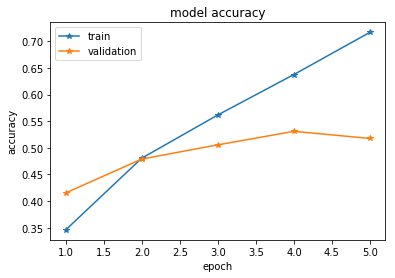

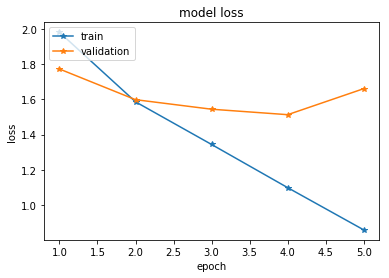

In [18]:
plt.plot(np.arange(1,6),history.history['acc'],'-*')
plt.plot(np.arange(1,6),history.history['val_acc'],'-*')
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('model_new_5_train_VGG_5_epoch_acc')
plt.show()
# summarize history for loss
plt.plot(np.arange(1,6),history.history['loss'],'-*')
plt.plot(np.arange(1,6),history.history['val_loss'],'-*')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.savefig('model_new_5_train_VGG_5_epoch_loss')
plt.show()

In [103]:
#testing part

In [19]:
def create_test_dataset_acs(label_list=list(range(15)),IMG_SIZE=50):
    #total images in training dataset=71094
    # mean image size 206,164
    DATASET_DIR='/home/vsl5/Desktop/shivansh/datasets'
    DATASET_FILE_PATH='fashion-data2/test.txt'

    train_file=open(os.path.join(DATASET_DIR,DATASET_FILE_PATH),'r')
    train_file_paths=train_file.read().split('\n')
    train_file.close()

    FILE_PATH='fashion-data2/labels.json'
    label_file=open(os.path.join(DATASET_DIR,FILE_PATH),'r')
    label_read=label_file.read()
    label_file.close()

    temp1=label_read.split('\n')
    label_file.close()

    labels_dict={}
    for i in temp1[1:-2]:
        key=i.split(':')
        if int(key[0]) in label_list:
            labels_dict[int(key[0])]=key[1][:-2]

    #IMG_SIZE=50
    training_data=[]
    k=0
    for img_path in tqdm(train_file_paths[:-1]):
        k=k+1
        #img_path_full=os.path.join(DATASET_DIR+'/fashion-data/images',img_path+'.jpg')
        #img=cv2.imread(img_path_full,cv2.IMREAD_GRAYSCALE)
        #img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
        
        #print(img)
        if int(img_path[0]) in label_list:
            img_path_full=os.path.join(DATASET_DIR+'/fashion-data2/images',img_path+'.jpg')
            img=cv2.cvtColor(cv2.imread(img_path_full,cv2.IMREAD_COLOR),cv2.COLOR_BGR2RGB)
            img=cv2.resize(img,(IMG_SIZE,IMG_SIZE))
            label=create_label(int(img_path[0:2].split('/')[0]),len(label_list))
            training_data.append([np.array(img),label])
    #shuffle(training_data)
    #np.save('acs_train_data_labels-{}.npy'.format(len(label_list)),training_data)
    return training_data,labels_dict

In [20]:
testing_data,labels_dict=create_test_dataset_acs(IMG_SIZE=100)

100%|██████████| 17858/17858 [00:34<00:00, 513.12it/s]


In [21]:
X_predict=np.array([np.array(i[0]) for i in testing_data])

In [22]:
ans=model_final.predict(X_predict,verbose=1)

17858/17858 [==============================] - 56s 3ms/step


In [40]:
corr_class=0
wrong_class_samples=[]
corr_class_samples=[]
for i in range(len(testing_data)):
    if np.argmax(ans[i])==np.argmax(testing_data[i][1]):
        corr_class+=1
        corr_class_samples.append((i,np.argmax(ans[i]),labels_dict[np.argmax(testing_data[i][1])]))
    else:
        wrong_class_samples.append((i,np.argmax(ans[i]),labels_dict[np.argmax(testing_data[i][1])]))

test_set_accuracy=corr_class/len(ans)
print(test_set_accuracy)

0.5024638817336767


In [42]:
corr_class_samples[0]

(6, 0, "  'blouses")

  'suit, suit of clothes


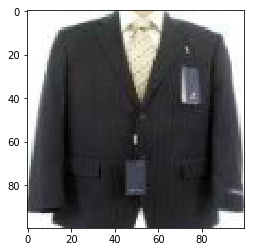

  'suit, suit of clothes


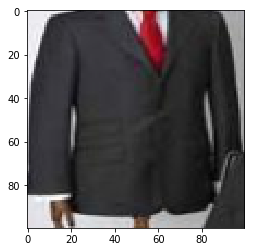

  'suit, suit of clothes


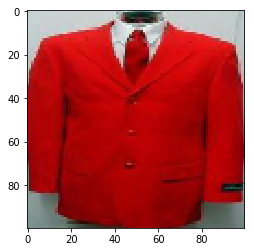

  'suit, suit of clothes


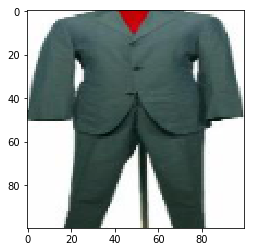

  'suit, suit of clothes


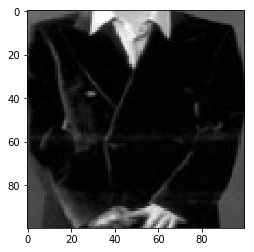

  'suit, suit of clothes


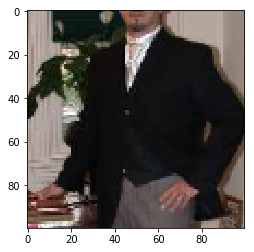

  'suit, suit of clothes


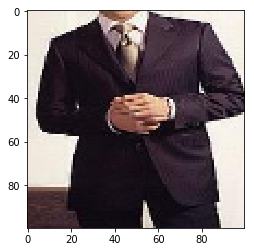

  'suit, suit of clothes


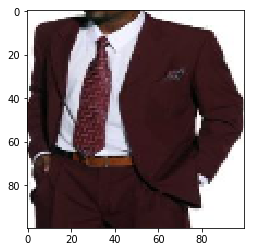

  'suit, suit of clothes


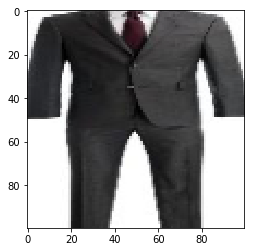

  'suit, suit of clothes


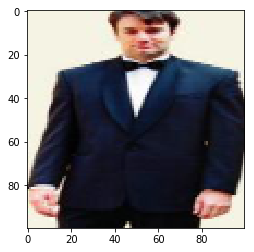

  'suit, suit of clothes


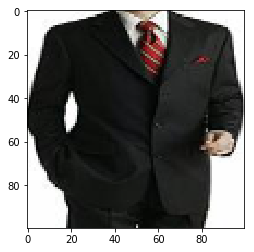

  'suit, suit of clothes


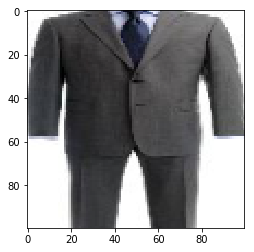

  'suit, suit of clothes


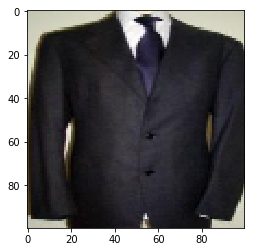

  'suit, suit of clothes


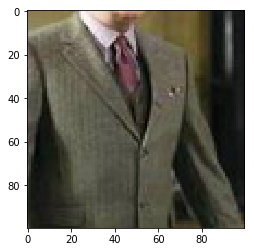

  'suit, suit of clothes


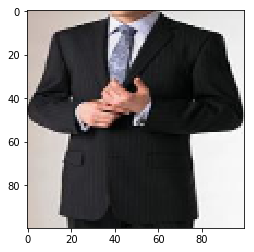

  'suit, suit of clothes


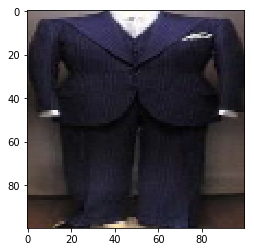

  'suit, suit of clothes


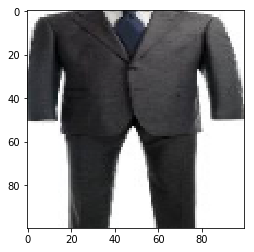

  'suit, suit of clothes


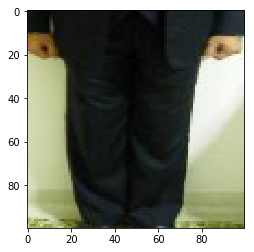

  'suit, suit of clothes


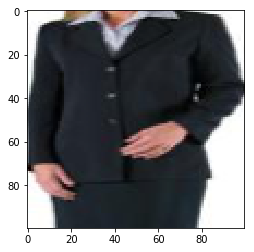

  'suit, suit of clothes


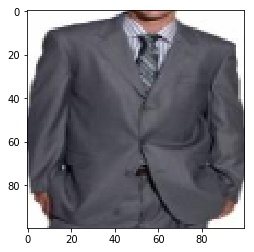

  'suit, suit of clothes


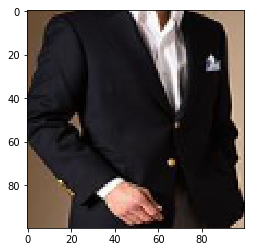

  'suit, suit of clothes


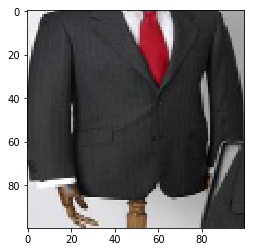

  'suit, suit of clothes


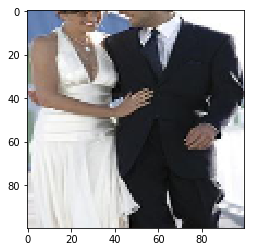

  'suit, suit of clothes


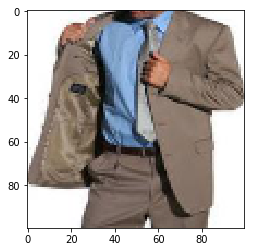

  'suit, suit of clothes


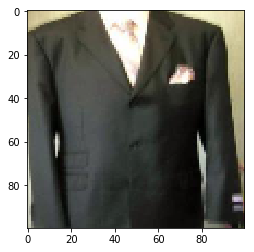

  'suit, suit of clothes


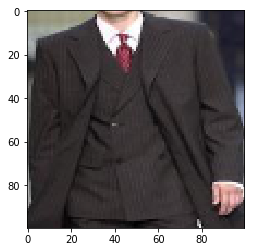

  'suit, suit of clothes


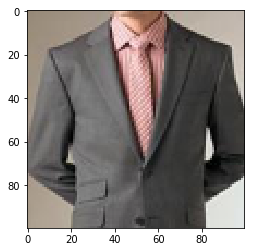

  'suit, suit of clothes


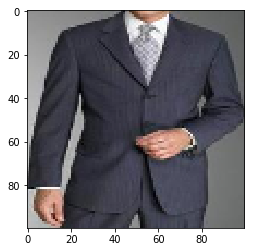

  'suit, suit of clothes


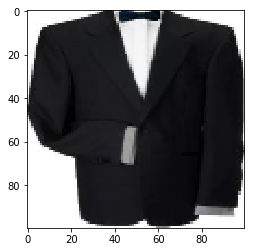

  'suit, suit of clothes


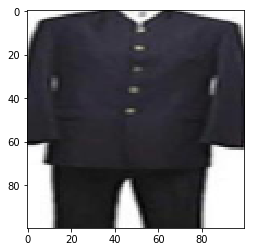

  'suit, suit of clothes


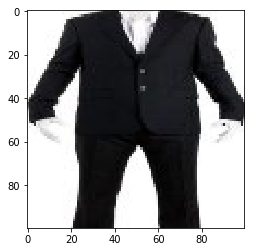

  'suit, suit of clothes


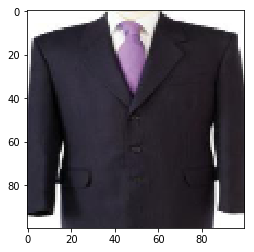

  'suit, suit of clothes


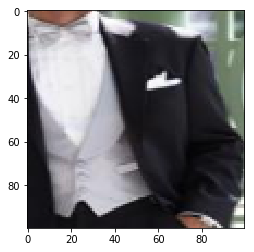

  'suit, suit of clothes


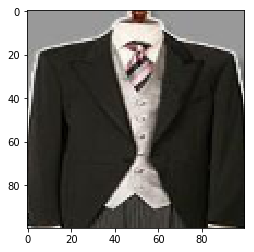

  'suit, suit of clothes


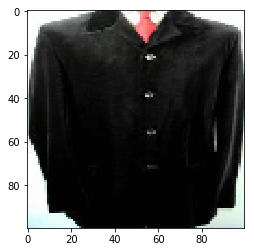

  'suit, suit of clothes


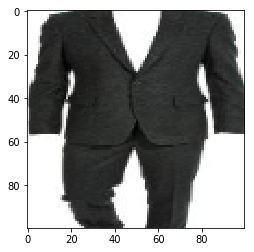

  'suit, suit of clothes


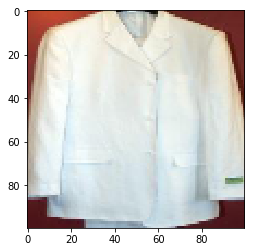

  'suit, suit of clothes


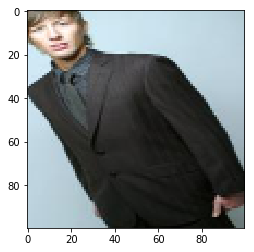

  'suit, suit of clothes


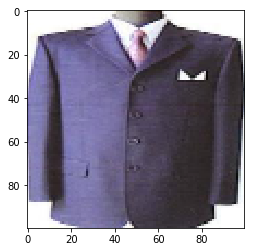

  'suit, suit of clothes


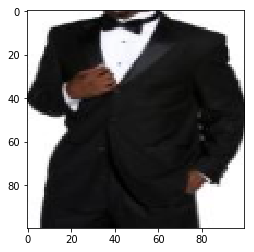

  'suit, suit of clothes


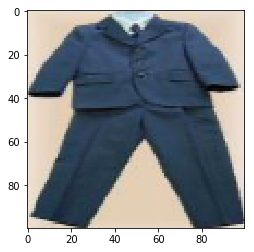

  'suit, suit of clothes


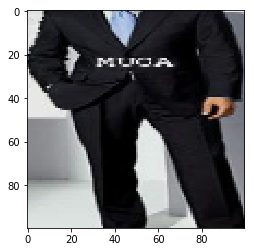

  'suit, suit of clothes


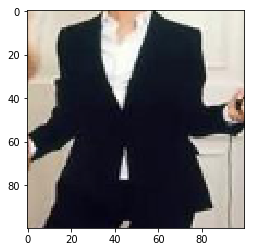

  'suit, suit of clothes


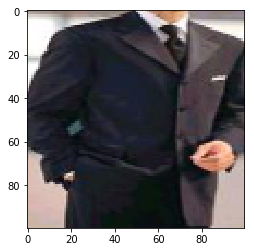

  'suit, suit of clothes


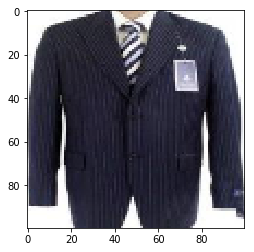

  'suit, suit of clothes


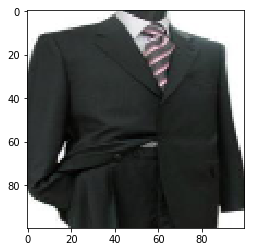

  'suit, suit of clothes


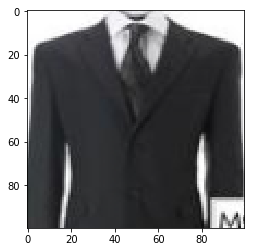

  'suit, suit of clothes


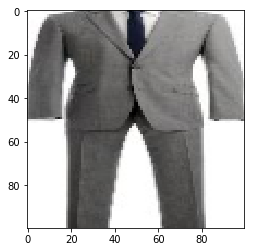

  'suit, suit of clothes


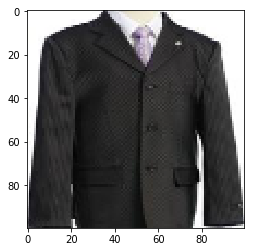

  'suit, suit of clothes


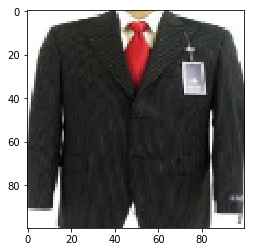

  'suit, suit of clothes


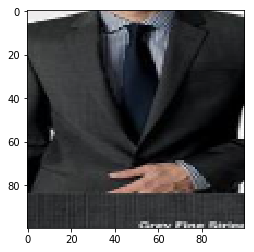

  'suit, suit of clothes


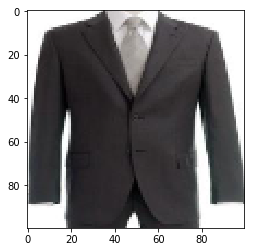

  'suit, suit of clothes


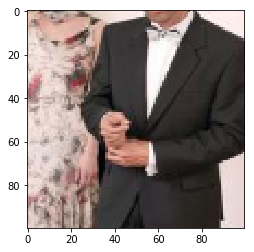

  'suit, suit of clothes


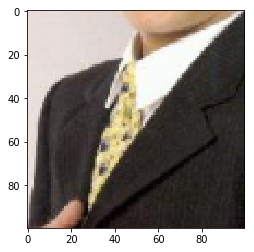

  'suit, suit of clothes


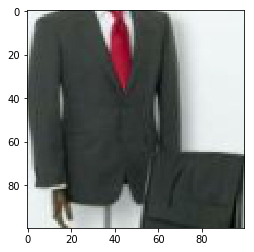

  'suit, suit of clothes


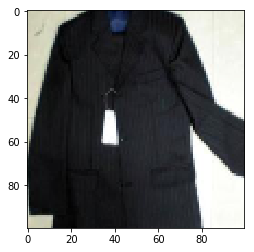

  'suit, suit of clothes


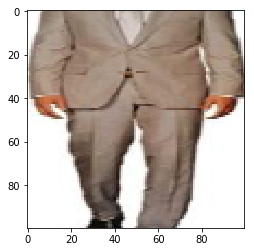

  'suit, suit of clothes


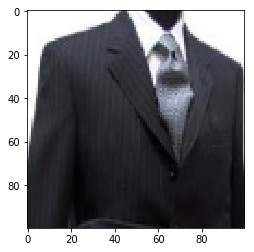

  'suit, suit of clothes


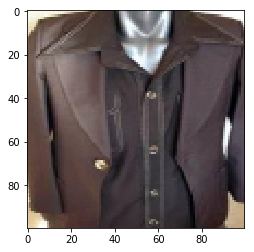

  'suit, suit of clothes


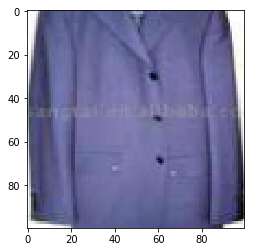

  'suit, suit of clothes


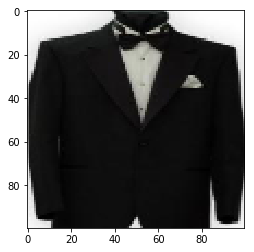

  'suit, suit of clothes


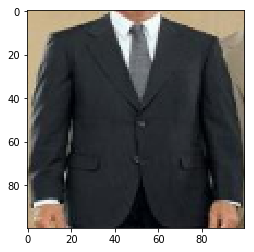

  'suit, suit of clothes


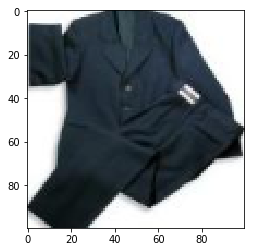

  'suit, suit of clothes


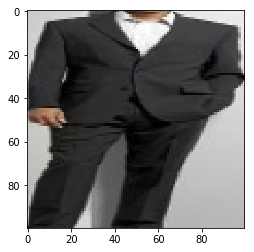

  'suit, suit of clothes


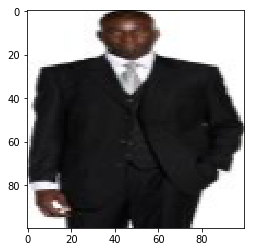

  'suit, suit of clothes


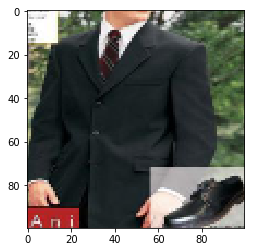

  'suit, suit of clothes


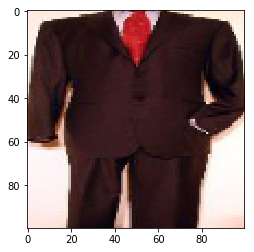

  'suit, suit of clothes


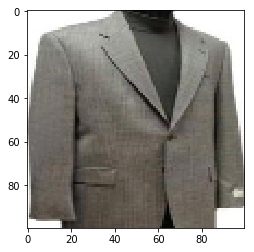

  'suit, suit of clothes


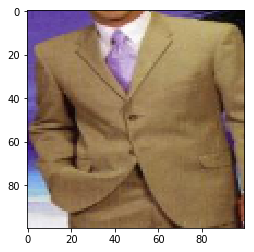

  'suit, suit of clothes


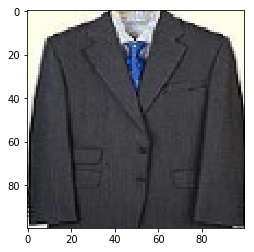

  'suit, suit of clothes


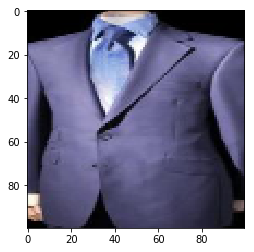

  'suit, suit of clothes


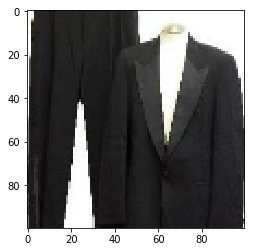

  'suit, suit of clothes


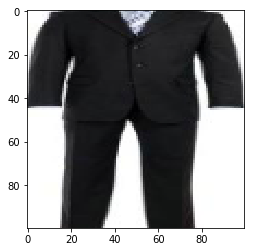

  'suit, suit of clothes


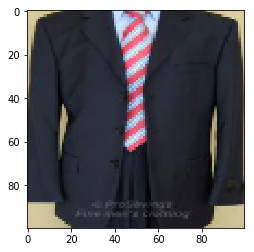

  'suit, suit of clothes


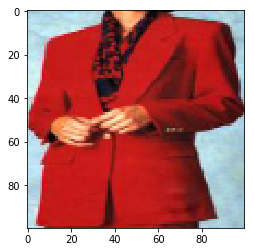

  'suit, suit of clothes


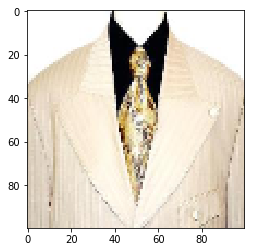

  'suit, suit of clothes


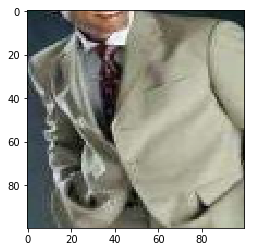

  'suit, suit of clothes


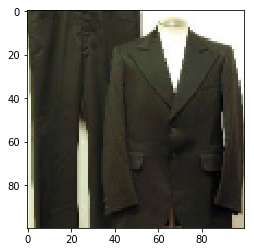

  'suit, suit of clothes


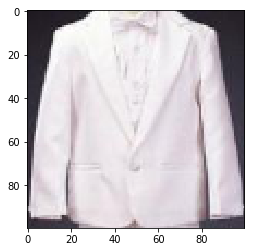

  'suit, suit of clothes


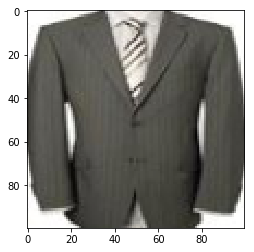

  'suit, suit of clothes


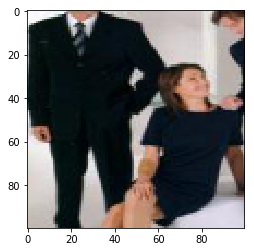

  'suit, suit of clothes


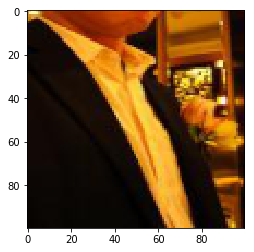

  'suit, suit of clothes


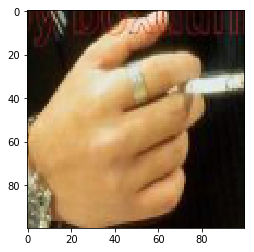

  'suit, suit of clothes


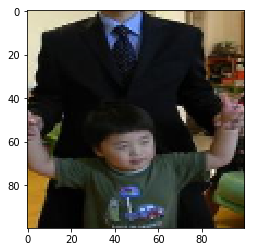

  'suit, suit of clothes


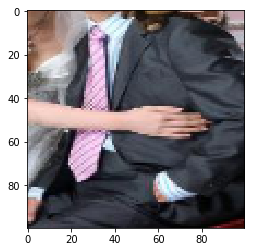

  'suit, suit of clothes


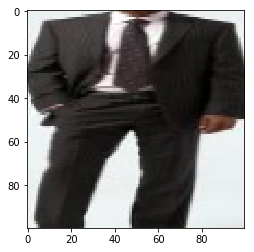

  'suit, suit of clothes


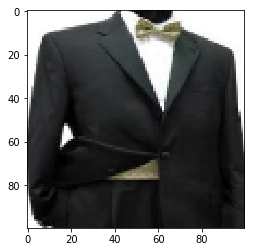

  'suit, suit of clothes


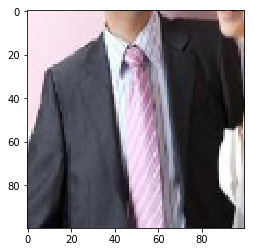

  'suit, suit of clothes


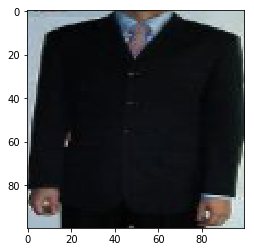

  'suit, suit of clothes


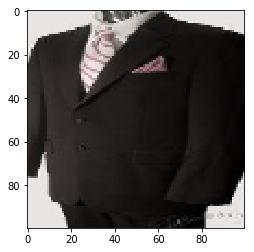

  'suit, suit of clothes


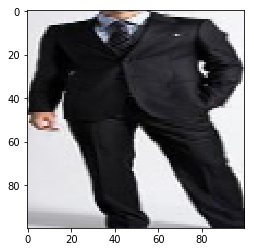

  'suit, suit of clothes


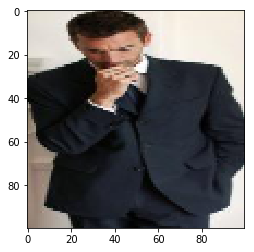

  'suit, suit of clothes


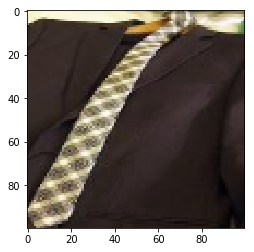

  'suit, suit of clothes


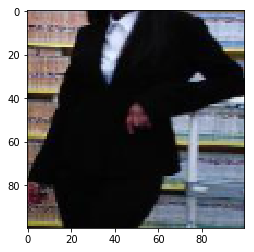

  'suit, suit of clothes


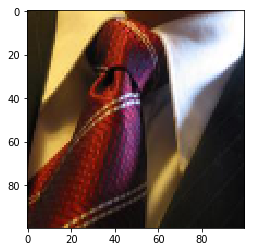

  'suit, suit of clothes


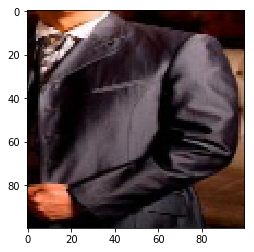

  'suit, suit of clothes


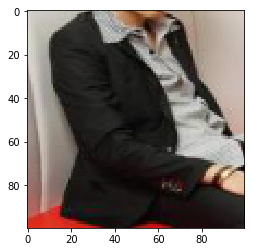

  'suit, suit of clothes


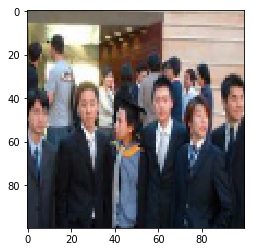

  'suit, suit of clothes


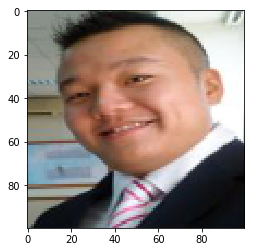

  'suit, suit of clothes


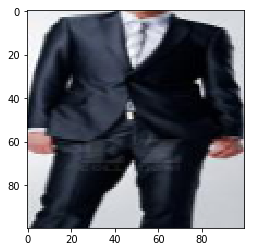

  'suit, suit of clothes


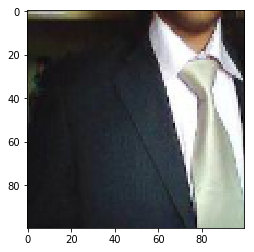

  'suit, suit of clothes


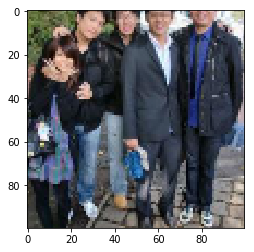

  'suit, suit of clothes


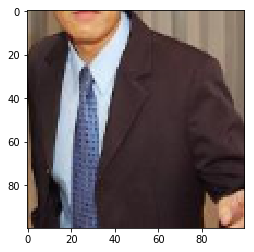

  'suit, suit of clothes


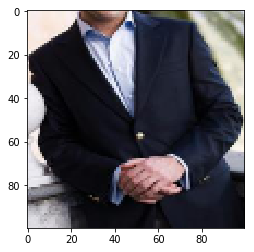

  'suit, suit of clothes


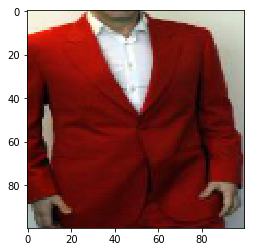

  'suit, suit of clothes


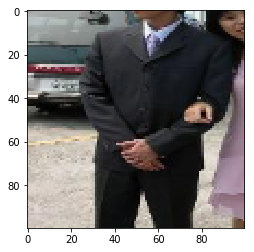

  'suit, suit of clothes


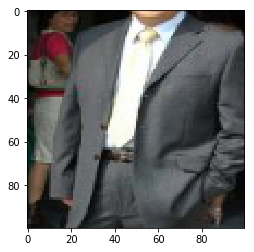

  'suit, suit of clothes


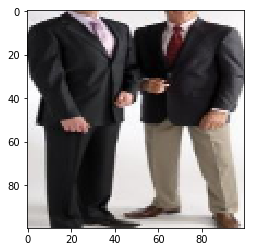

  'suit, suit of clothes


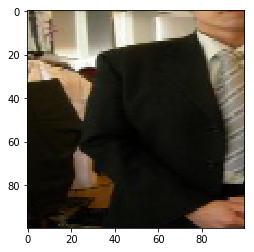

  'suit, suit of clothes


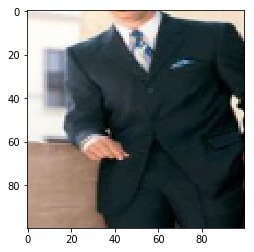

  'suit, suit of clothes


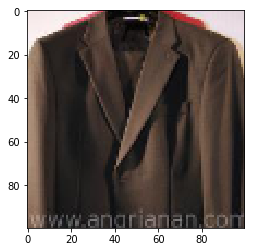

  'suit, suit of clothes


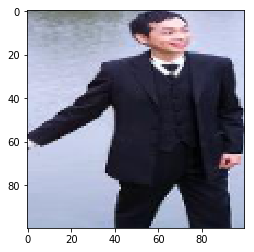

  'suit, suit of clothes


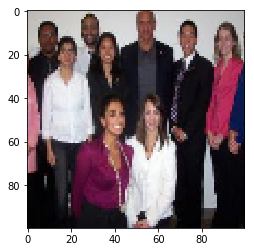

  'suit, suit of clothes


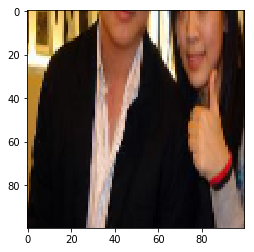

  'suit, suit of clothes


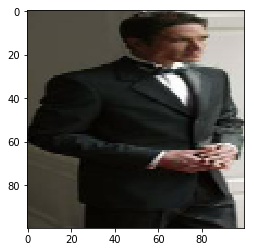

  'suit, suit of clothes


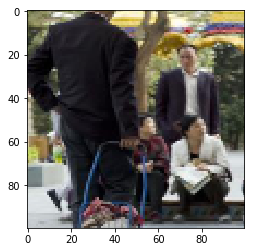

  'suit, suit of clothes


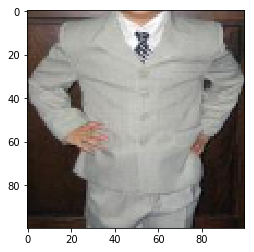

  'suit, suit of clothes


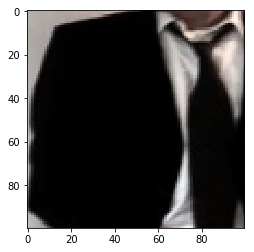

  'suit, suit of clothes


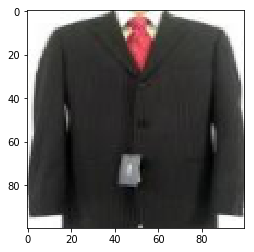

  'suit, suit of clothes


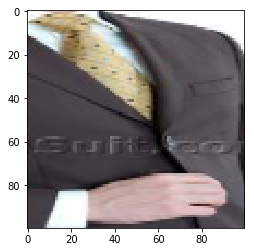

  'suit, suit of clothes


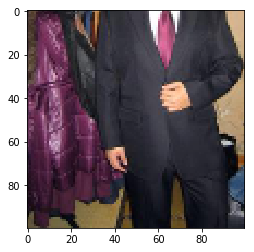

  'suit, suit of clothes


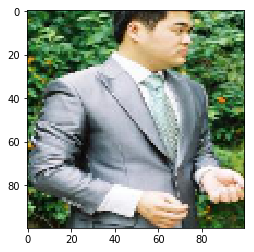

  'suit, suit of clothes


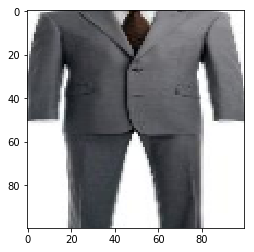

  'suit, suit of clothes


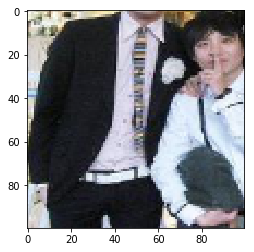

  'suit, suit of clothes


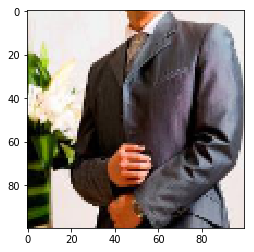

  'suit, suit of clothes


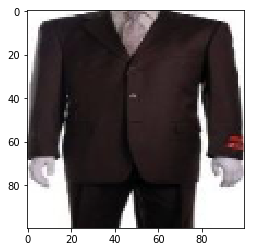

  'suit, suit of clothes


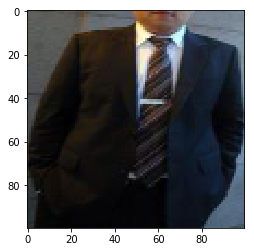

  'suit, suit of clothes


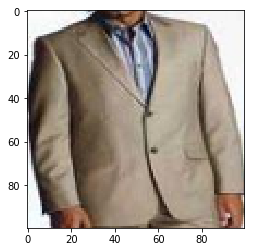

  'suit, suit of clothes


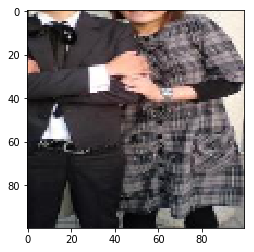

  'suit, suit of clothes


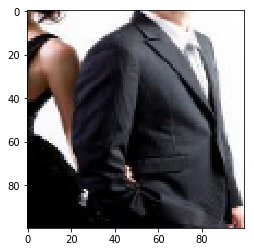

  'suit, suit of clothes


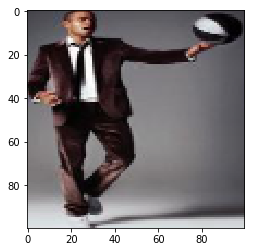

  'suit, suit of clothes


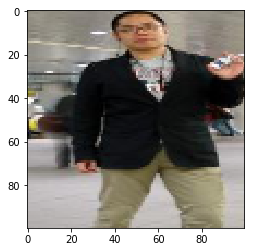

  'suit, suit of clothes


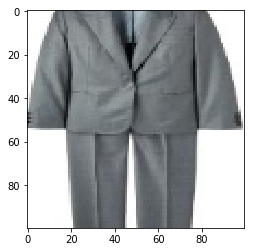

  'suit, suit of clothes


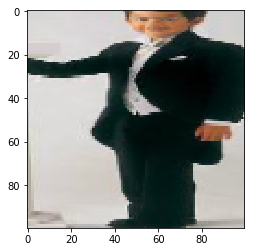

  'suit, suit of clothes


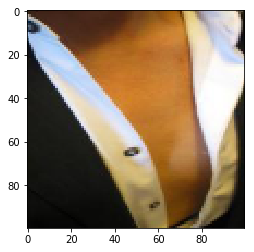

  'suit, suit of clothes


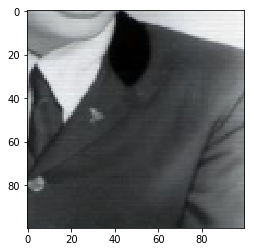

  'suit, suit of clothes


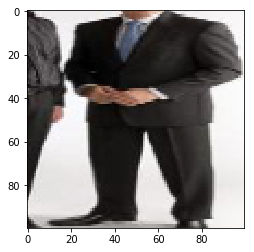

  'suit, suit of clothes


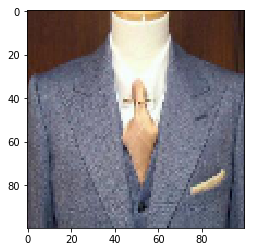

  'suit, suit of clothes


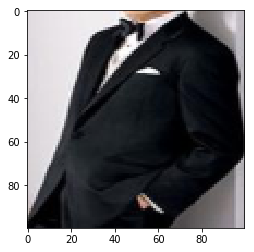

  'suit, suit of clothes


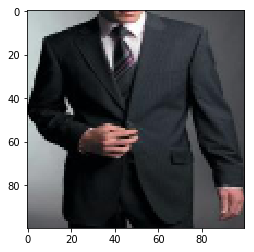

  'suit, suit of clothes


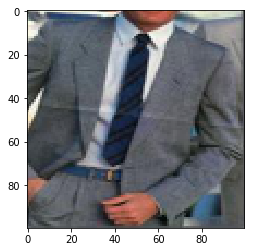

  'suit, suit of clothes


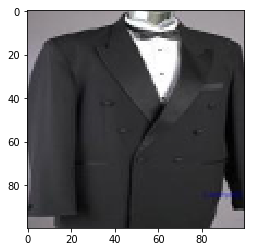

  'suit, suit of clothes


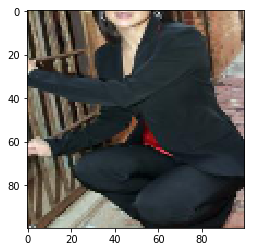

  'suit, suit of clothes


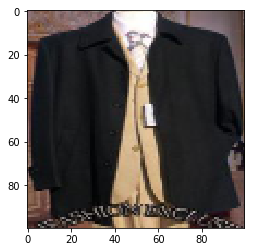

  'suit, suit of clothes


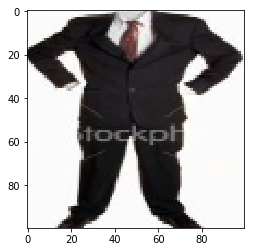

  'suit, suit of clothes


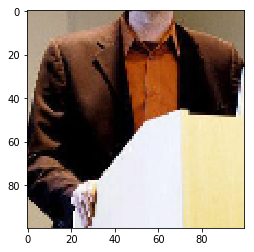

  'suit, suit of clothes


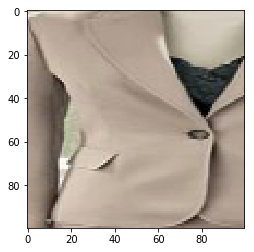

  'suit, suit of clothes


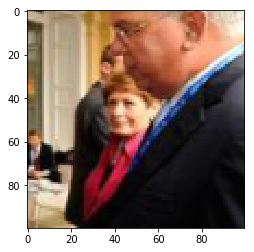

  'suit, suit of clothes


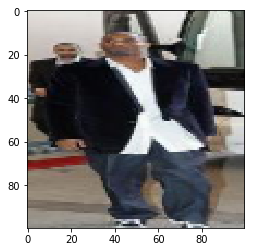

  'suit, suit of clothes


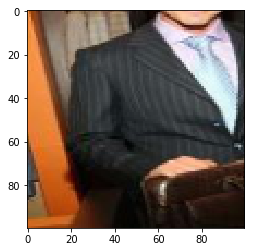

  'suit, suit of clothes


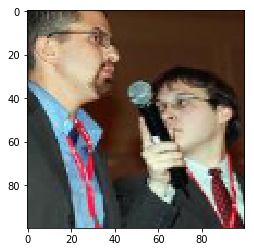

  'suit, suit of clothes


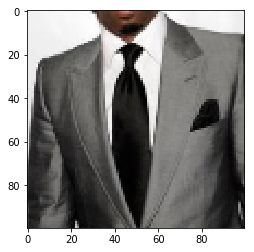

  'suit, suit of clothes


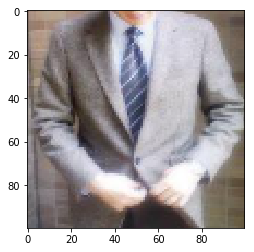

  'suit, suit of clothes


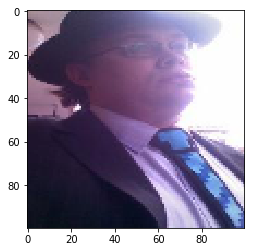

  'suit, suit of clothes


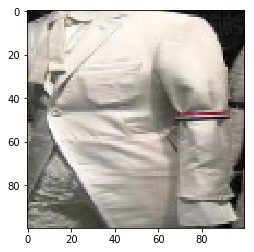

  'suit, suit of clothes


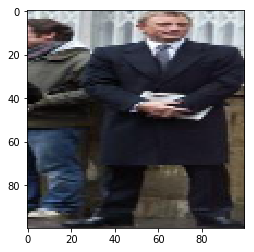

  'suit, suit of clothes


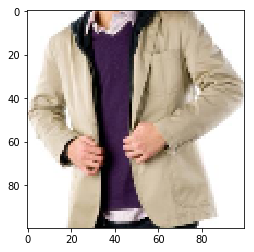

  'suit, suit of clothes


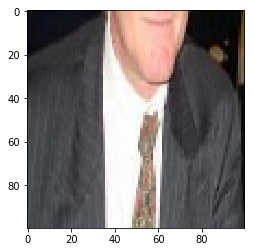

  'suit, suit of clothes


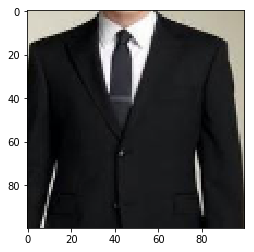

  'suit, suit of clothes


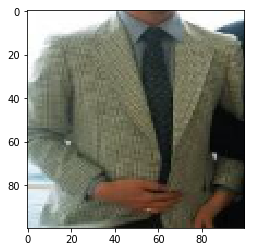

  'suit, suit of clothes


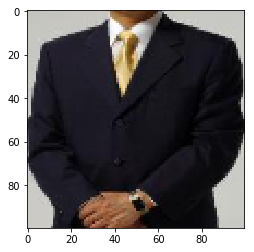

  'suit, suit of clothes


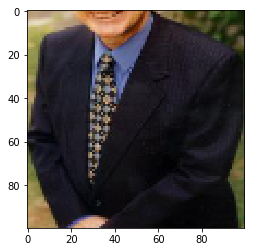

  'suit, suit of clothes


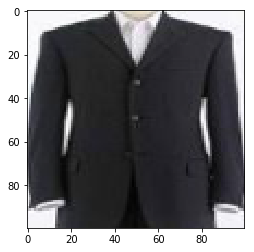

  'suit, suit of clothes


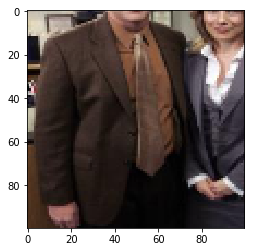

  'suit, suit of clothes


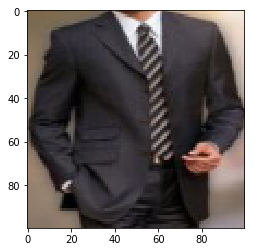

  'suit, suit of clothes


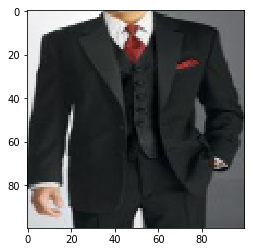

  'suit, suit of clothes


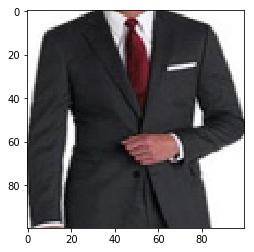

  'suit, suit of clothes


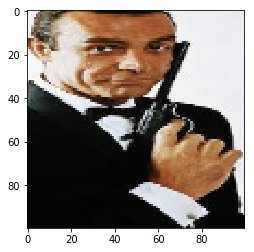

  'suit, suit of clothes


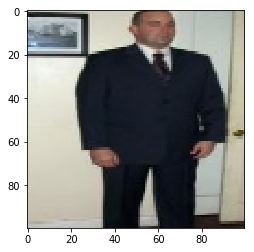

  'suit, suit of clothes


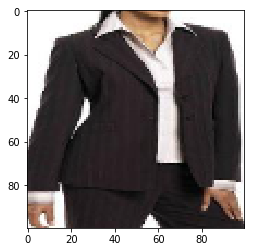

  'suit, suit of clothes


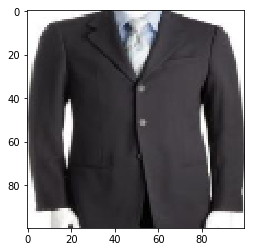

  'suit, suit of clothes


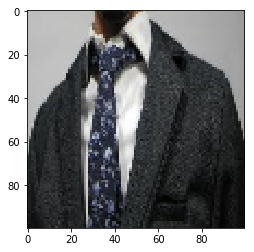

  'suit, suit of clothes


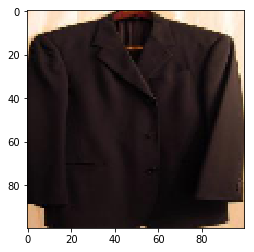

  'suit, suit of clothes


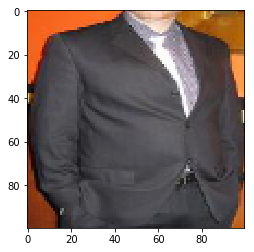

  'suit, suit of clothes


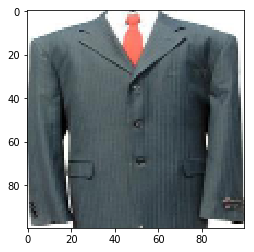

  'suit, suit of clothes


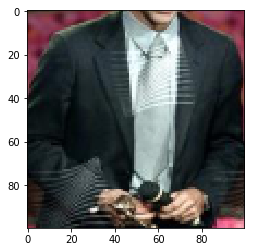

  'suit, suit of clothes


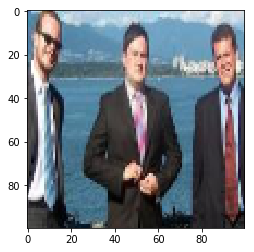

  'suit, suit of clothes


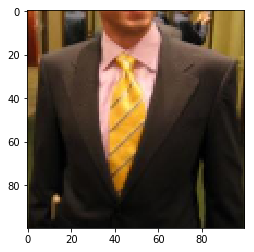

  'suit, suit of clothes


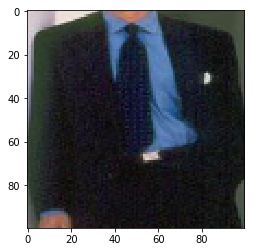

  'suit, suit of clothes


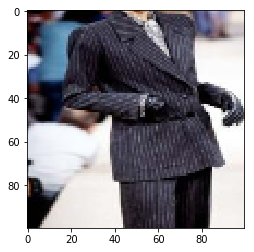

  'suit, suit of clothes


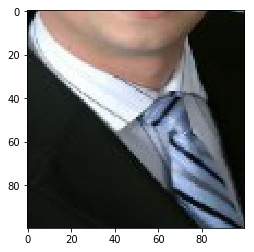

  'suit, suit of clothes


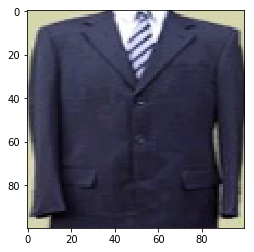

  'suit, suit of clothes


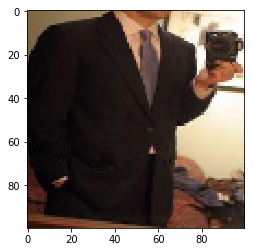

  'suit, suit of clothes


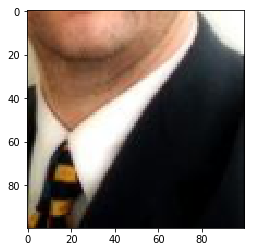

  'suit, suit of clothes


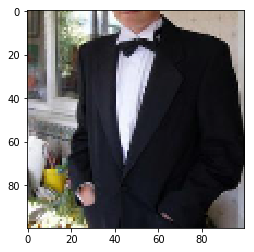

  'suit, suit of clothes


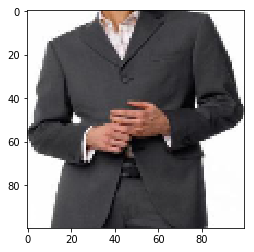

  'suit, suit of clothes


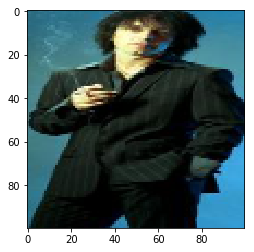

  'suit, suit of clothes


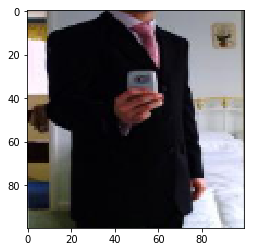

  'suit, suit of clothes


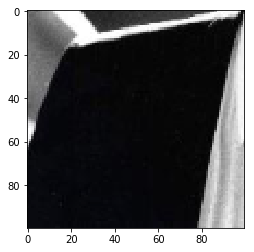

  'suit, suit of clothes


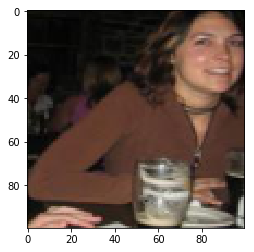

  'suit, suit of clothes


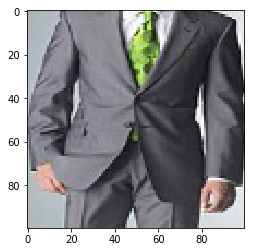

  'suit, suit of clothes


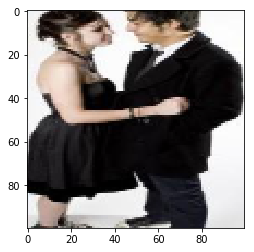

  'suit, suit of clothes


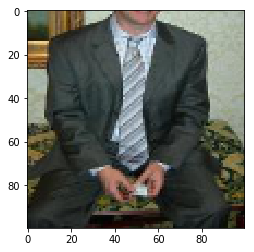

  'suit, suit of clothes


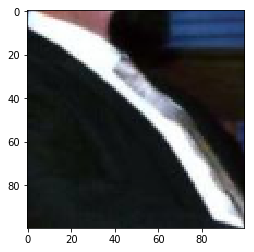

  'suit, suit of clothes


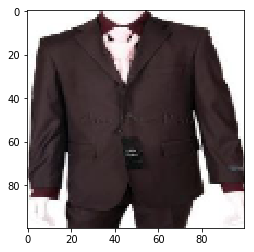

  'suit, suit of clothes


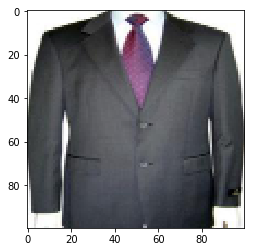

  'suit, suit of clothes


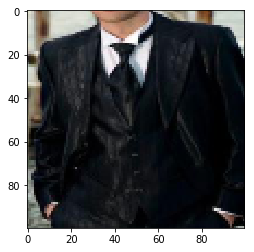

  'suit, suit of clothes


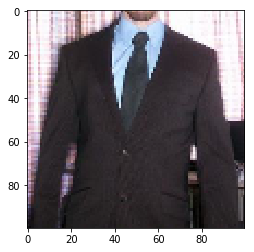

  'suit, suit of clothes


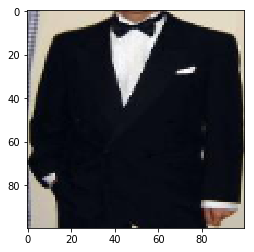

  'suit, suit of clothes


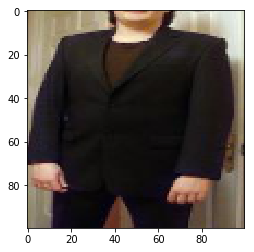

  'suit, suit of clothes


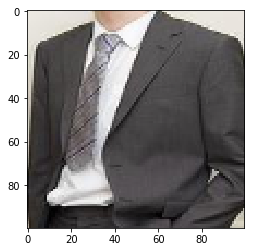

  'suit, suit of clothes


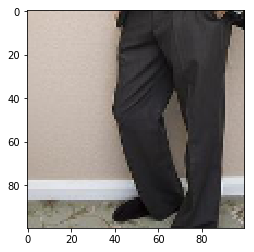

  'suit, suit of clothes


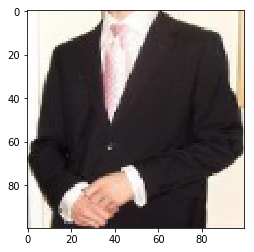

  'suit, suit of clothes


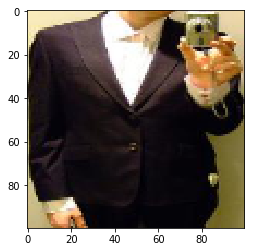

  'suit, suit of clothes


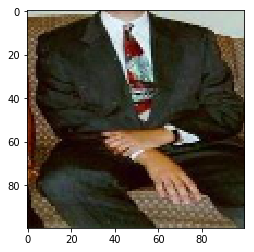

  'suit, suit of clothes


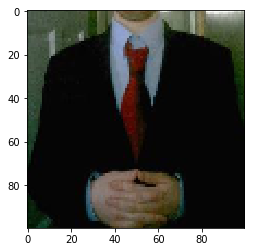

  'suit, suit of clothes


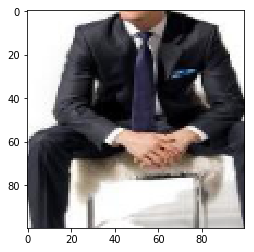

  'suit, suit of clothes


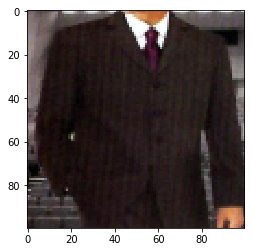

  'suit, suit of clothes


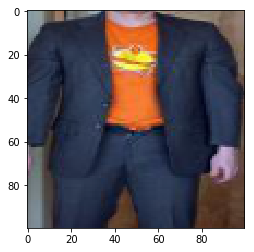

  'suit, suit of clothes


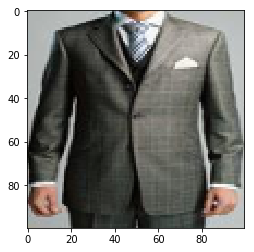

  'suit, suit of clothes


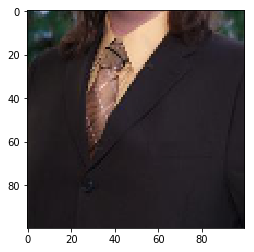

  'suit, suit of clothes


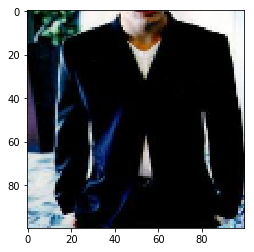

  'suit, suit of clothes


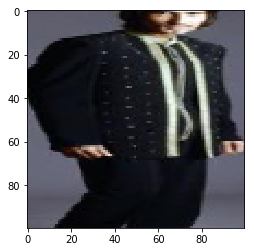

  'suit, suit of clothes


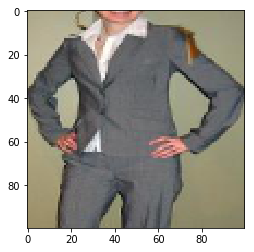

  'suit, suit of clothes


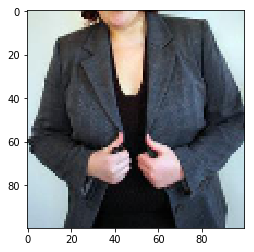

  'suit, suit of clothes


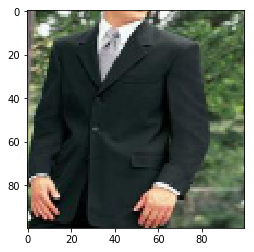

  'suit, suit of clothes


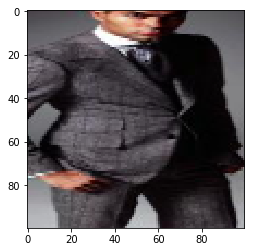

  'suit, suit of clothes


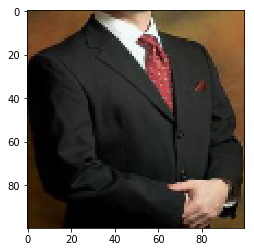

  'suit, suit of clothes


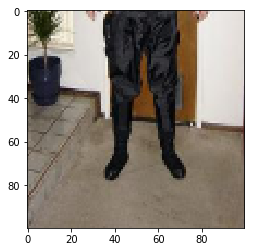

  'suit, suit of clothes


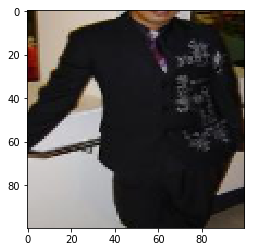

  'suit, suit of clothes


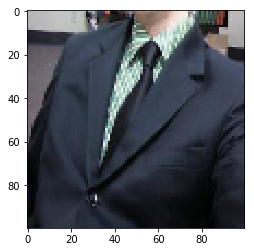

  'suit, suit of clothes


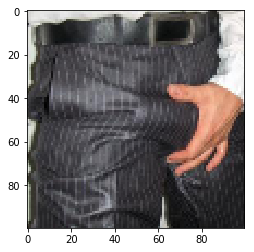

  'suit, suit of clothes


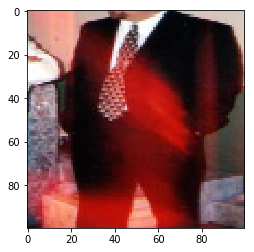

  'suit, suit of clothes


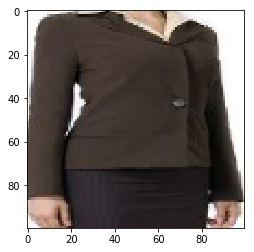

  'suit, suit of clothes


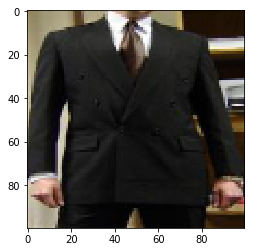

  'suit, suit of clothes


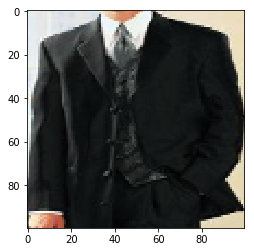

  'suit, suit of clothes


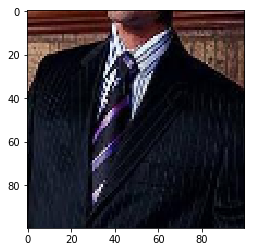

  'suit, suit of clothes


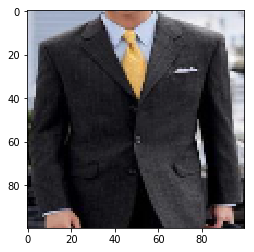

  'suit, suit of clothes


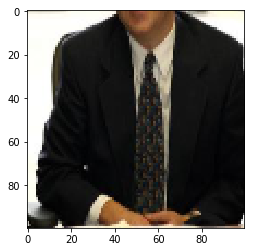

  'suit, suit of clothes


KeyboardInterrupt: 

In [54]:
for i in range(6000,6300):
    plt.imshow(testing_data[corr_class_samples[i][0]][0])
    print(corr_class_samples[i][2])
    plt.show()

 'uniform   'coat


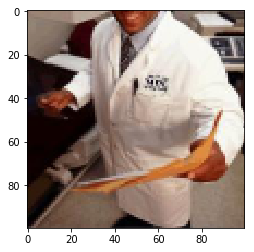

  'cloak   'coat


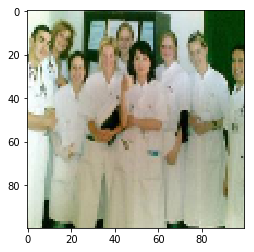

  'suit, suit of clothes   'coat


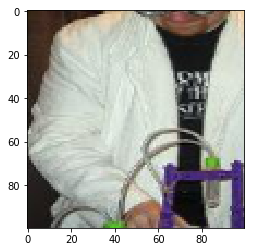

 'uniform   'coat


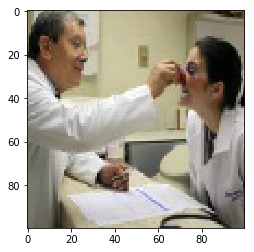

  'suit, suit of clothes   'coat


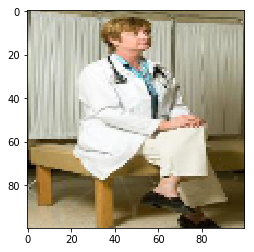

  'robe   'coat


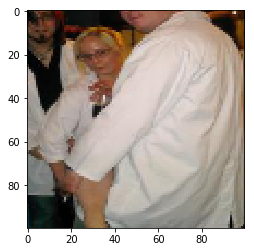

  'shirt   'coat


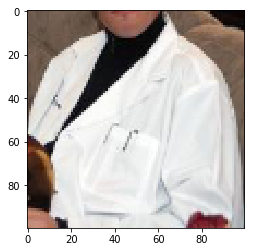

  'suit, suit of clothes   'coat


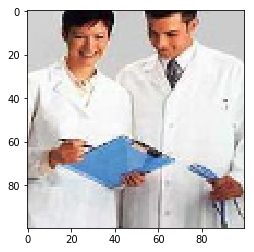

  'jacket   'coat


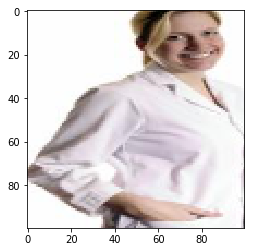

  'robe   'coat


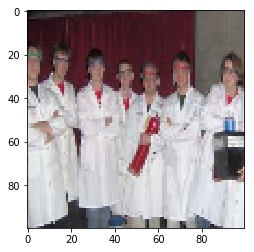

  'suit, suit of clothes   'coat


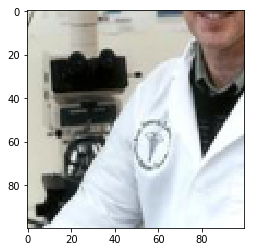

  'robe   'coat


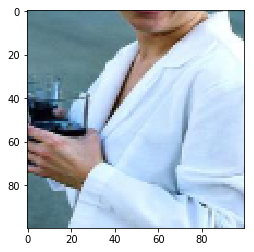

  'suit, suit of clothes   'coat


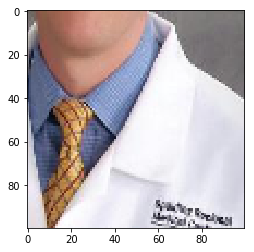

  'robe   'coat


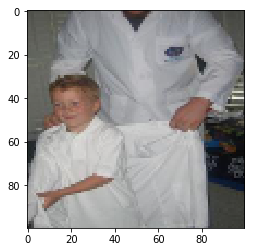

  'robe   'coat


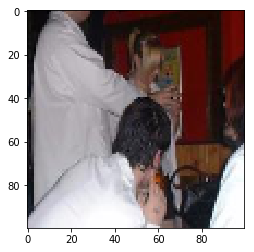

  'robe   'coat


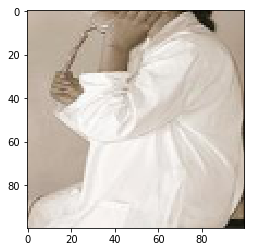

 'undergarment, upper body   'coat


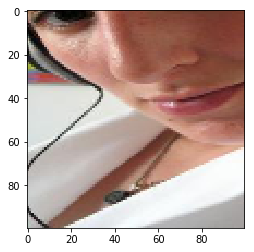

  'long dress   'coat


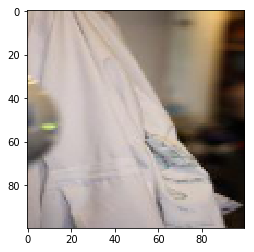

  'suit, suit of clothes   'coat


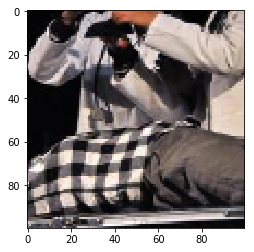

  'long dress   'coat


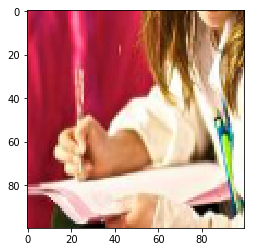

 'uniform   'coat


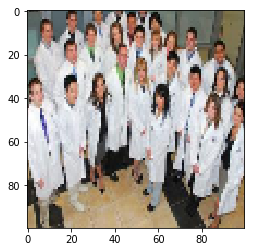

  'jacket   'coat


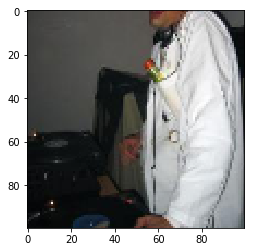

  'cloak   'coat


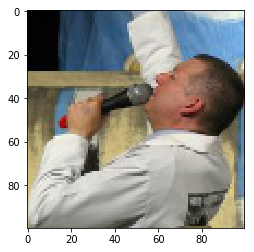

 'uniform   'coat


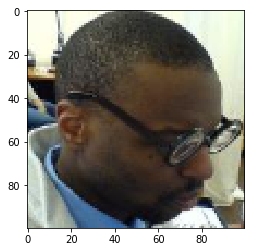

  'suit, suit of clothes   'coat


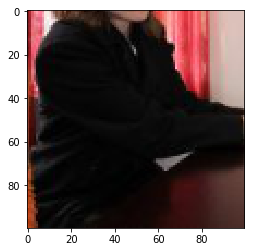

  'suit, suit of clothes   'coat


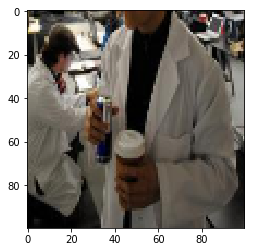

  'suit, suit of clothes   'coat


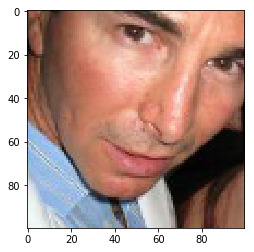

  'jacket   'coat


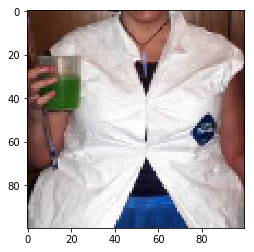

  'suit, suit of clothes   'coat


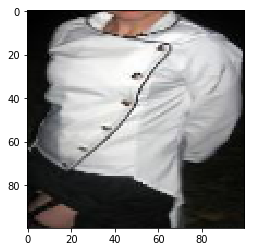

 'uniform   'coat


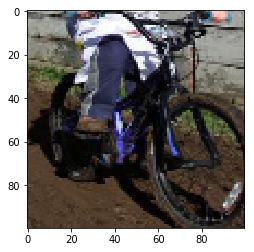

  'robe   'coat


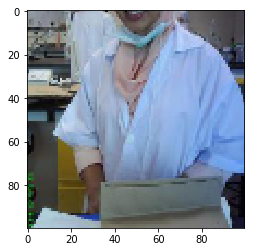

  'shirt   'coat


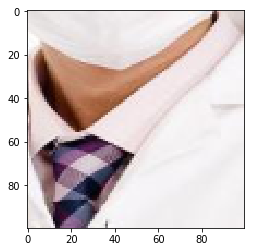

  'jacket   'coat


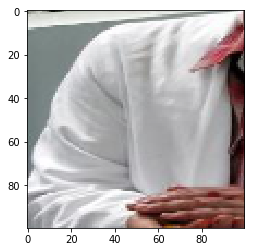

  'robe   'coat


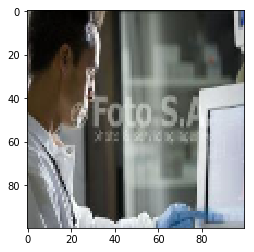

  'suit, suit of clothes   'coat


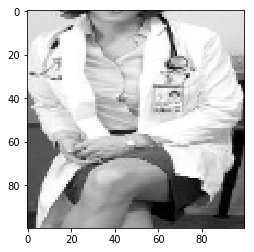

  'jacket   'coat


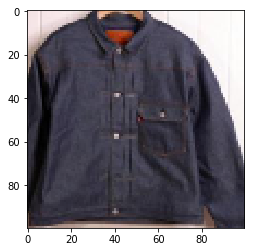

  'jacket   'coat


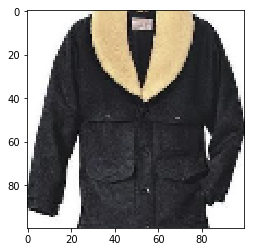

 'vest, waistcoat   'coat


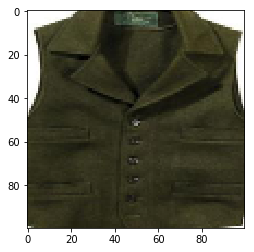

  'jacket   'coat


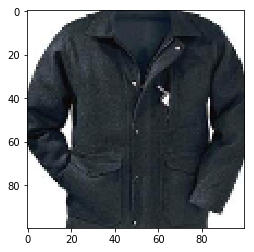

  'jacket   'coat


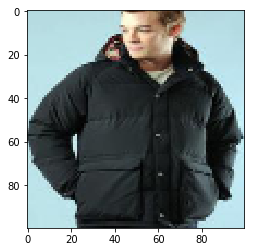

  'jacket   'coat


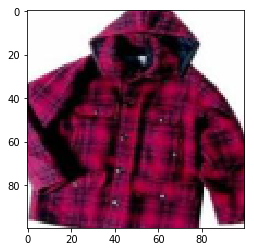

  'jacket   'coat


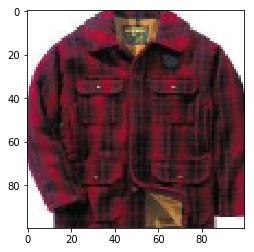

  'jacket   'coat


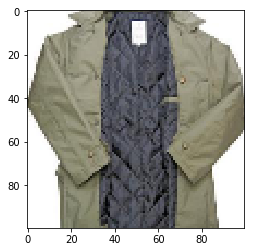

 'uniform   'coat


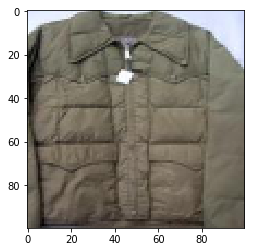

  'jacket   'coat


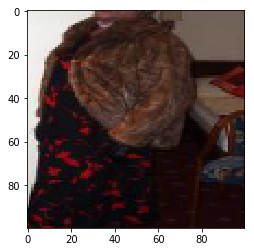

  'jacket   'coat


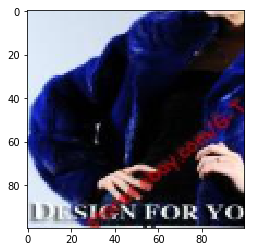

  'cloak   'coat


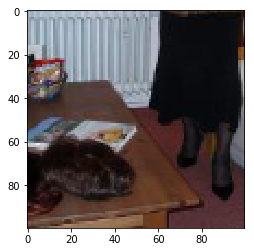

  'long dress   'coat


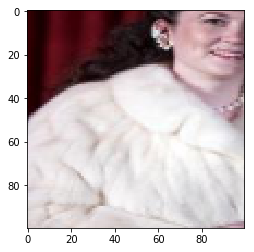

 'undergarment, upper body   'coat


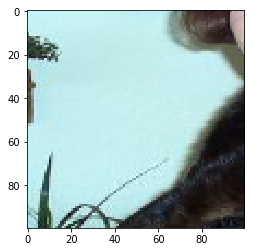

  'jacket   'coat


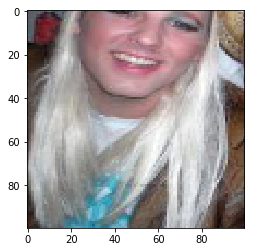

 'undergarment, upper body   'coat


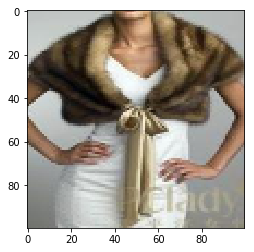

  'long dress   'coat


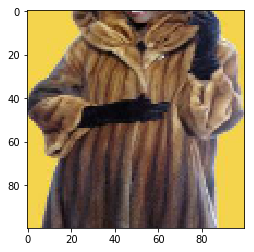

  'jacket   'coat


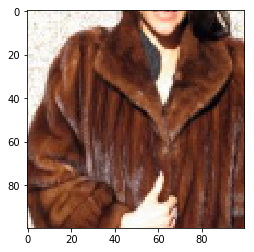

  'robe   'coat


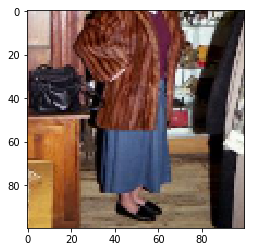

  'jacket   'coat


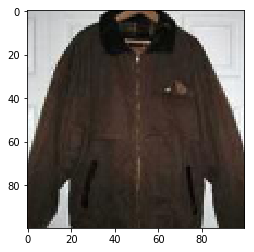

  'jacket   'coat


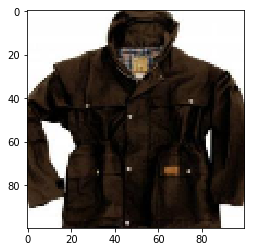

  'shirt   'coat


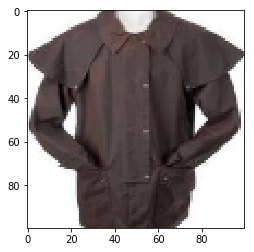

 'uniform   'coat


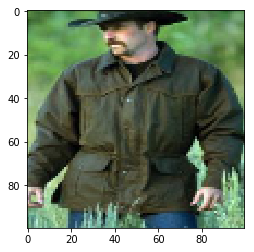

  'jacket   'coat


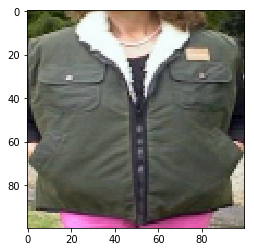

  'jacket   'coat


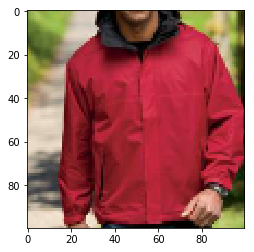

 'uniform   'coat


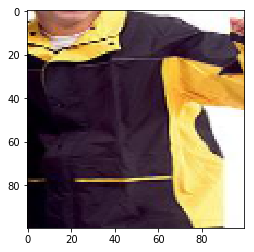

  'robe   'coat


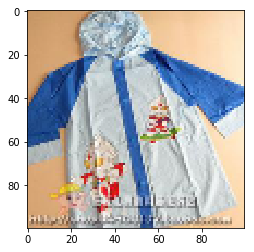

  'jacket   'coat


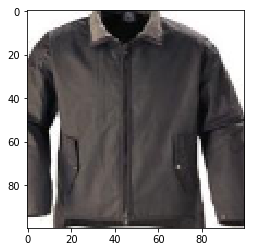

  'jacket   'coat


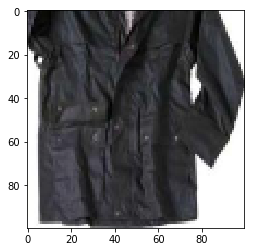

 'uniform   'coat


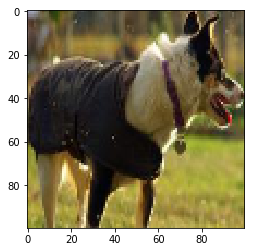

  'jacket   'coat


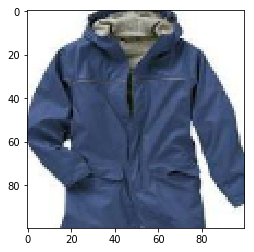

 'undergarment, upper body   'coat


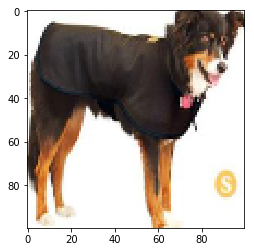

  'jacket   'coat


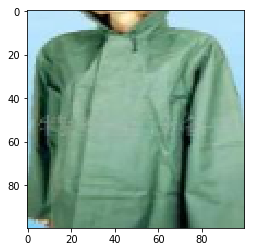

  'jacket   'coat


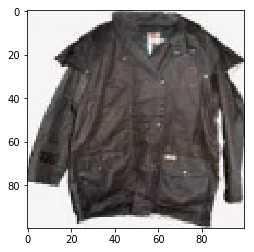

  'jacket   'coat


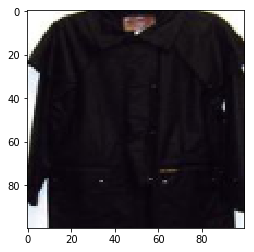

  'jacket   'coat


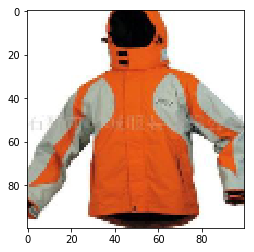

  'jacket   'coat


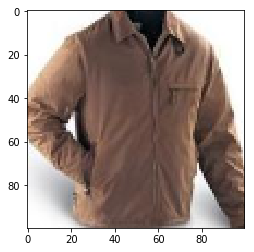

 'uniform   'coat


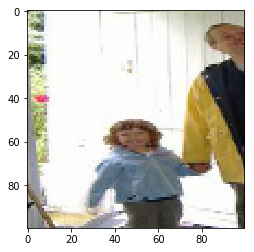

 'uniform   'coat


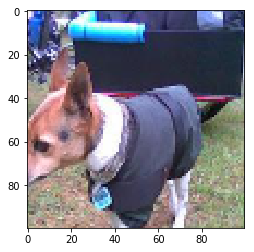

 'uniform   'coat


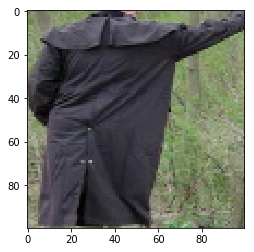

  'jacket   'coat


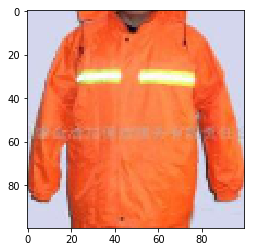

  'jacket   'coat


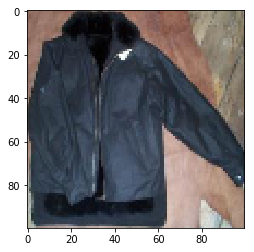

  'jacket   'coat


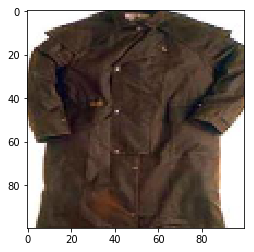

  'shirt   'coat


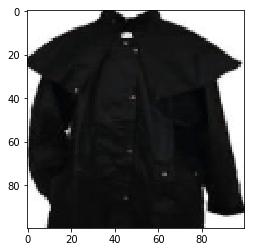

  'jacket   'coat


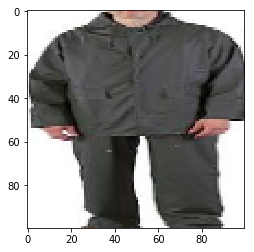

  'robe   'coat


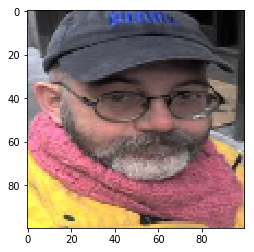

  'jacket   'coat


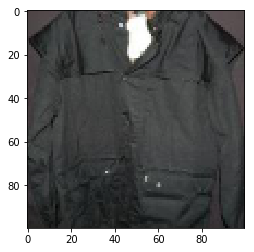

  'jacket   'coat


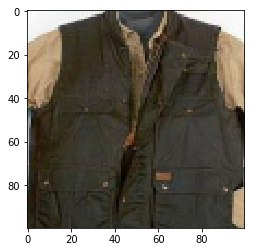

  'suit, suit of clothes   'coat


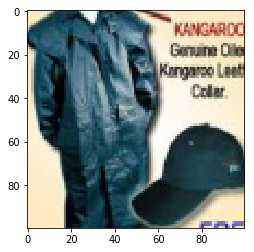

 'uniform   'coat


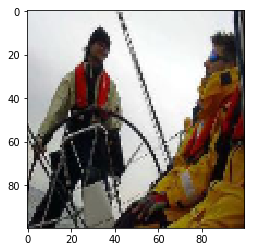

 'uniform   'coat


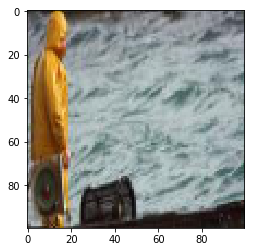

  'jacket   'coat


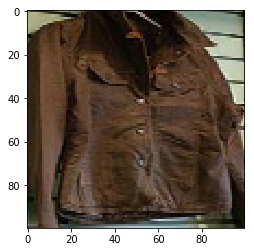

  'jacket   'coat


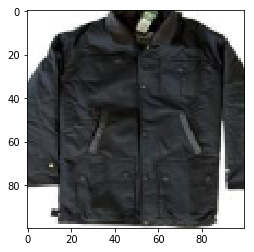

  'jacket   'coat


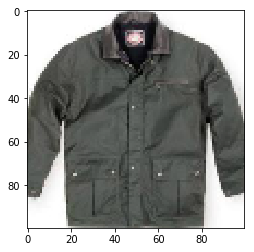

  'jacket   'coat


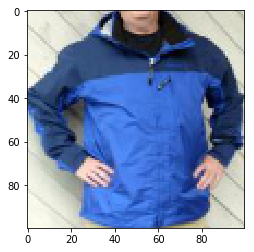

  'jacket   'coat


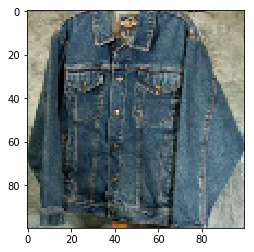

  'suit, suit of clothes   'coat


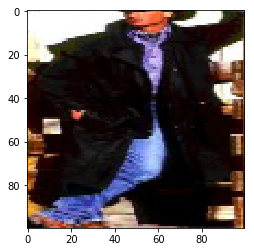

 'uniform   'coat


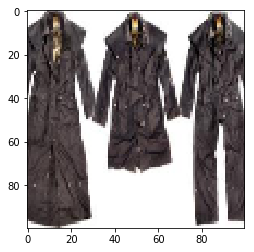

  'jacket   'coat


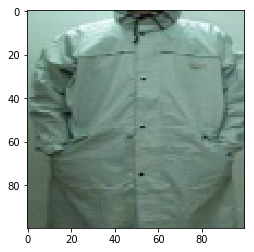

  'jacket   'coat


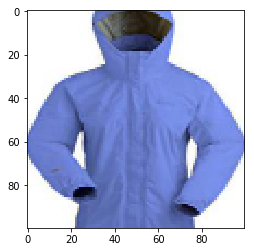

  'jacket   'coat


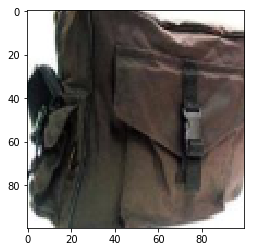

 'vest, waistcoat   'coat


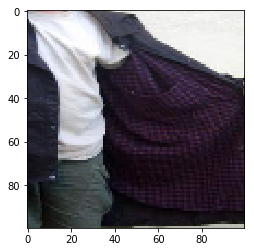

  'jacket   'coat


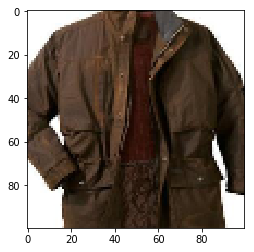

  'jacket   'coat


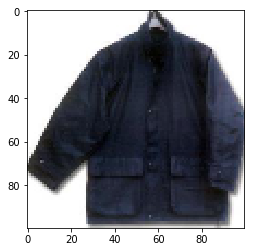

  'jacket   'coat


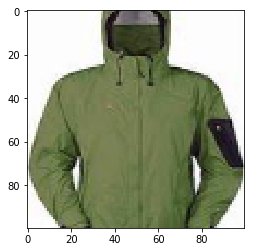

  'jacket   'coat


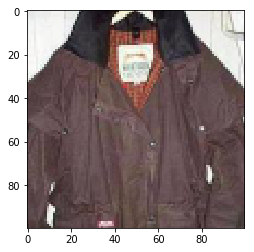

  'jacket   'coat


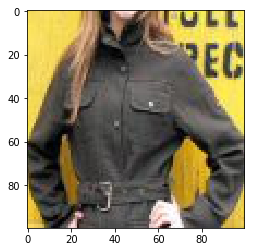

  'jacket   'coat


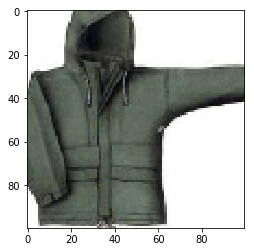

 'vest, waistcoat   'coat


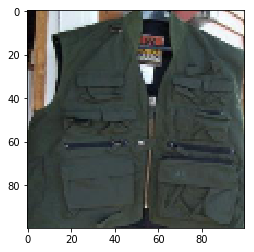

  'jacket   'coat


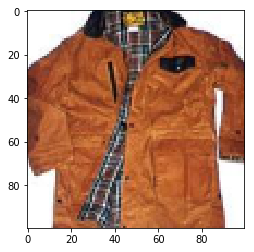

  'shirt   'coat


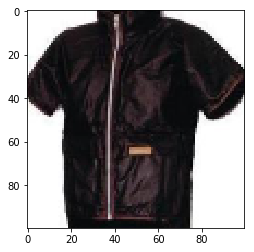

 'uniform   'coat


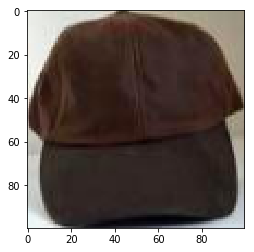

  'jacket   'coat


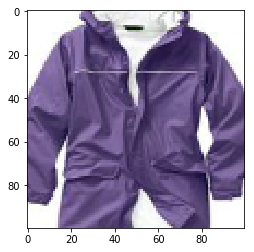

 'jersey, T-shirt, tee shirt   'coat


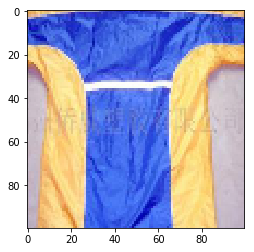

  'long dress   'coat


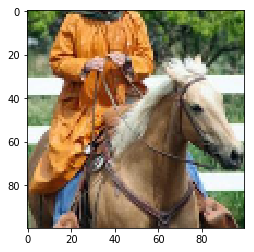

  'jacket   'coat


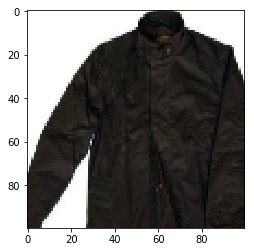

  'jacket   'coat


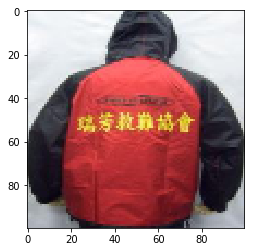

 'vest, waistcoat   'coat


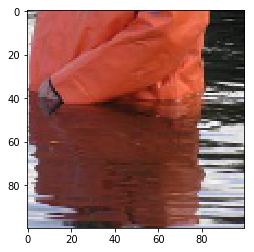

  'jacket   'coat


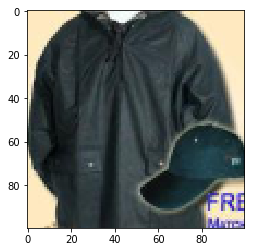

  'shirt   'coat


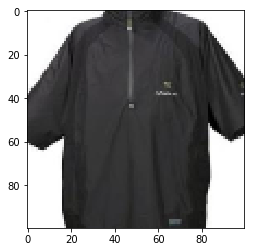

  'jacket   'coat


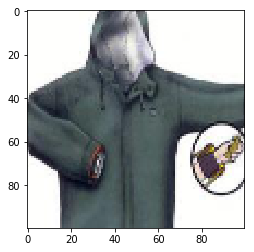

  'jacket   'coat


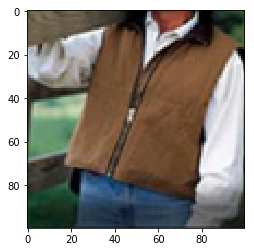

  'shirt   'coat


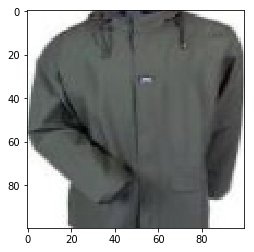

  'jacket   'coat


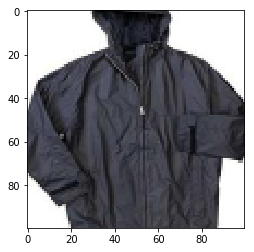

  'jacket   'coat


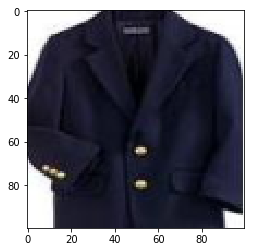

  'jacket   'coat


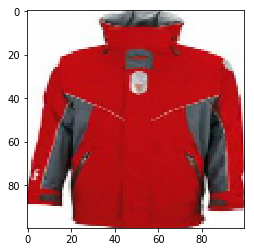

  'suit, suit of clothes   'coat


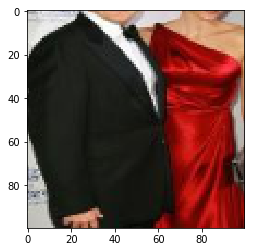

  'suit, suit of clothes   'coat


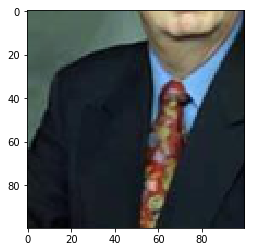

  'suit, suit of clothes   'coat


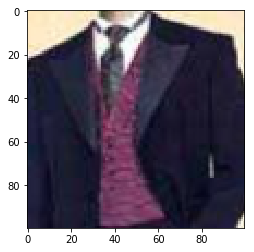

  'jacket   'coat


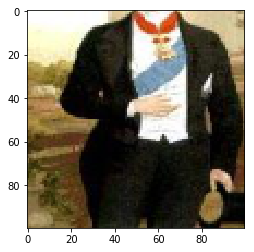

 'uniform   'coat


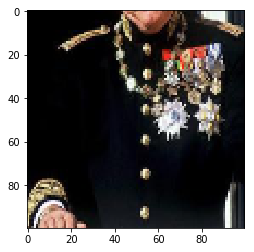

  'suit, suit of clothes   'coat


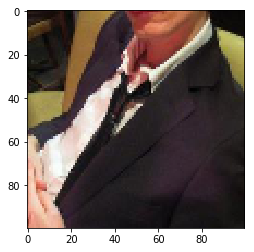

  'suit, suit of clothes   'coat


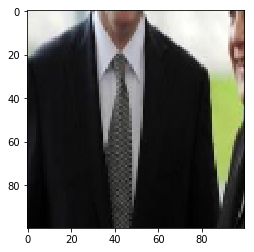

  'suit, suit of clothes   'coat


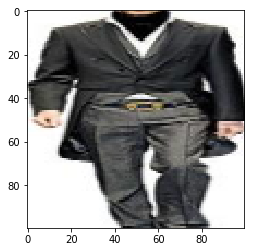

  'suit, suit of clothes   'coat


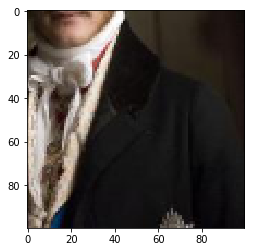

  'suit, suit of clothes   'coat


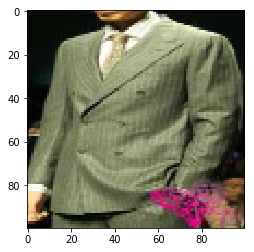

 'uniform   'coat


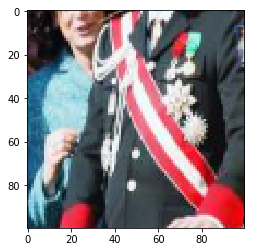

  'suit, suit of clothes   'coat


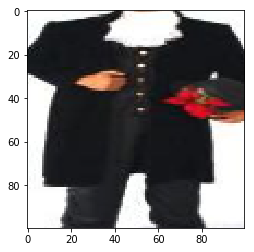

  'suit, suit of clothes   'coat


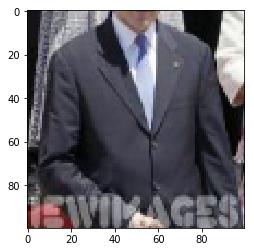

  'suit, suit of clothes   'coat


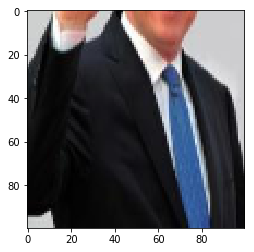

 'uniform   'coat


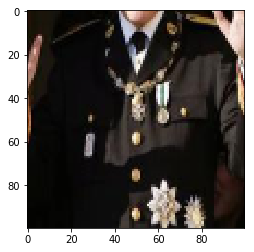

  'suit, suit of clothes   'coat


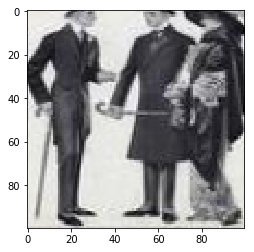

 'uniform   'coat


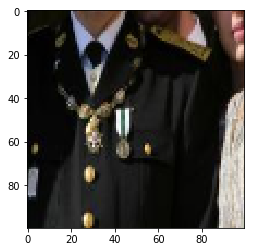

 'undergarment, upper body   'coat


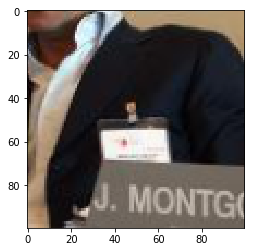

  'jacket   'coat


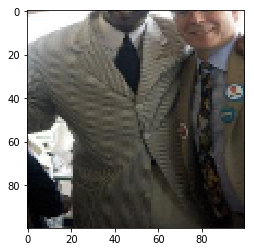

  'jacket   'coat


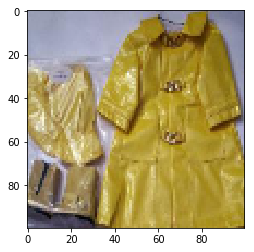

  'robe   'coat


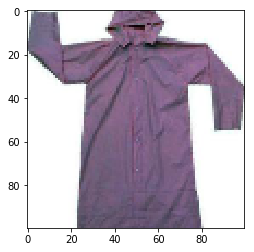

 'undergarment, upper body   'coat


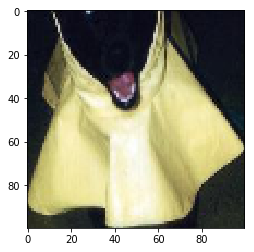

  'robe   'coat


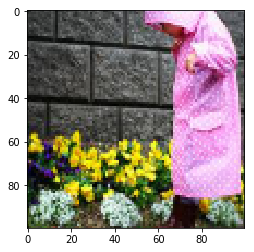

  'jacket   'coat


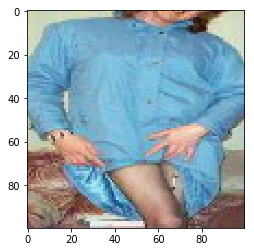

 'uniform   'coat


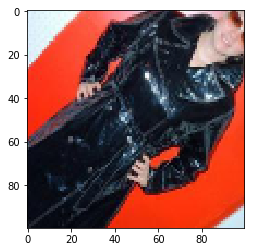

  'jacket   'coat


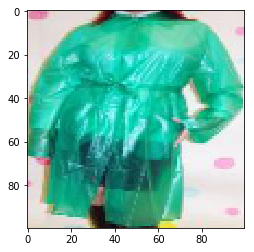

  'long dress   'coat


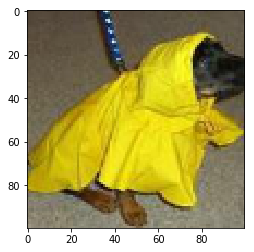

  'shirt   'coat


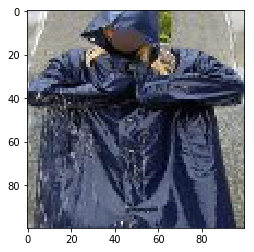

  'cloak   'coat


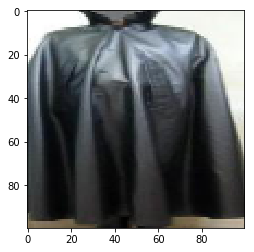

  'long dress   'coat


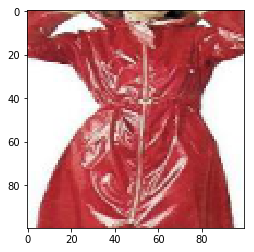

  'robe   'coat


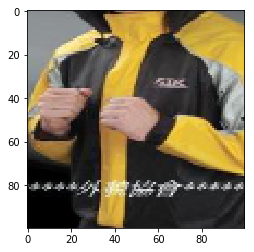

  'jacket   'coat


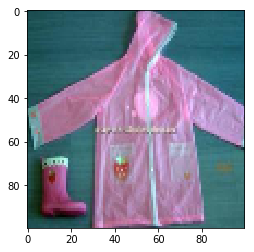

  'jacket   'coat


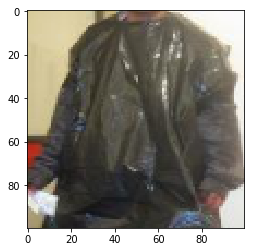

  'robe   'coat


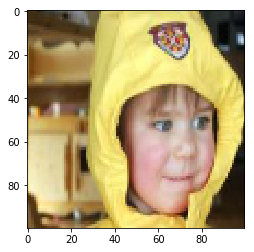

  'long dress   'coat


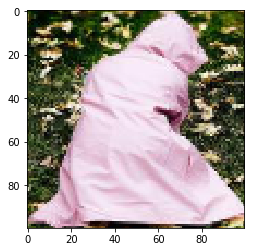

 'uniform   'coat


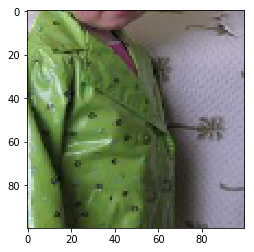

  'jacket   'coat


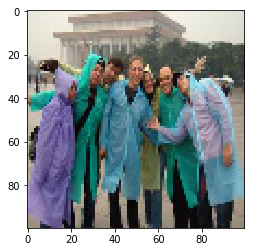

  'long dress   'coat


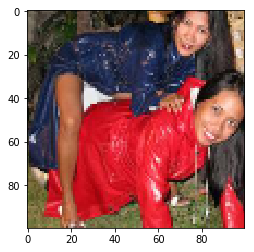

  'jacket   'coat


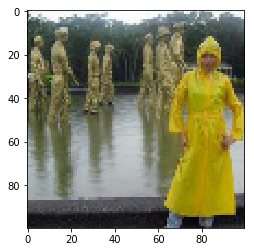

  'short dress   'coat


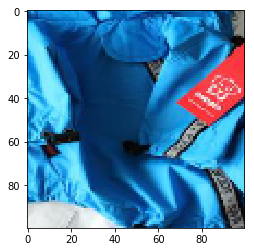

 'undergarment, upper body   'coat


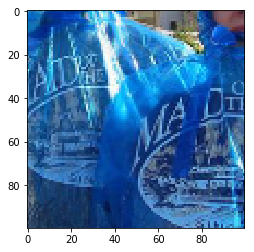

  'jacket   'coat


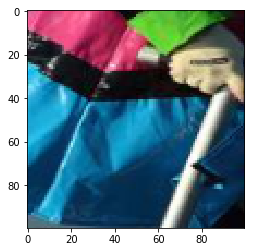

  'short dress   'coat


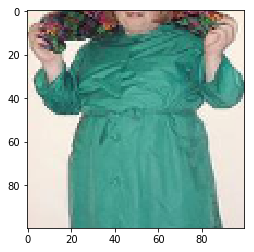

  'cloak   'coat


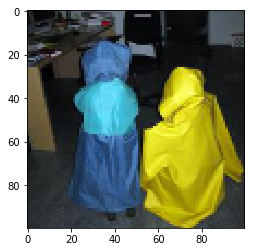

  'robe   'coat


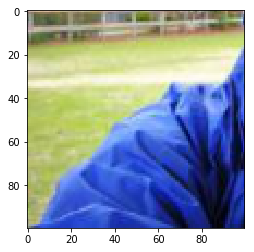

  'long dress   'coat


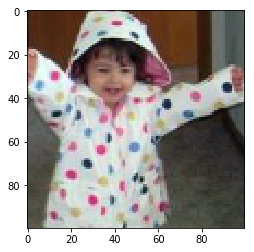

 'undergarment, upper body   'coat


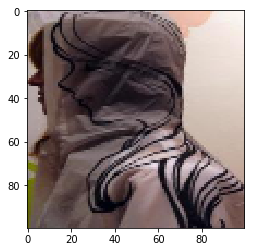

  'jacket   'coat


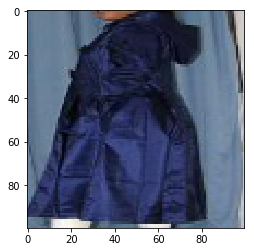

  'short dress   'coat


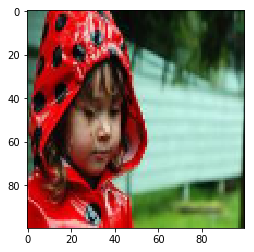

  'robe   'coat


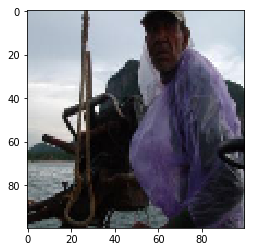

  'robe   'coat


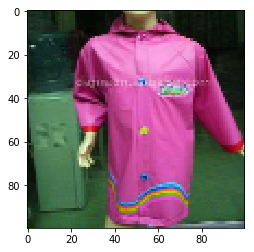

  'short dress   'coat


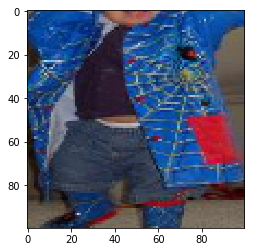

  'robe   'coat


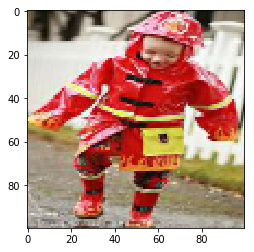

 'undergarment, upper body   'coat


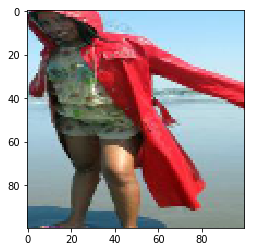

  'suit, suit of clothes   'coat


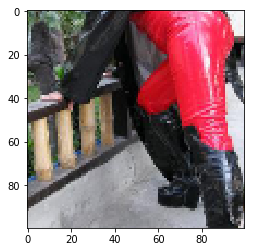

  'robe   'coat


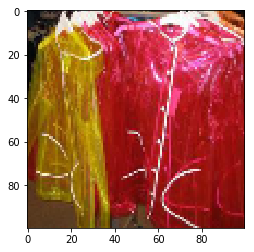

  'jacket   'coat


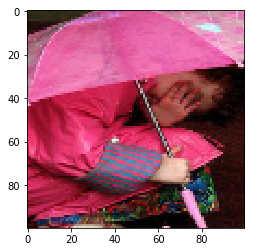

  'jacket   'coat


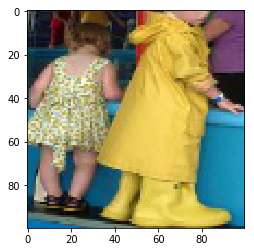

  'robe   'coat


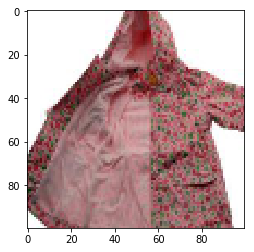

  'short dress   'coat


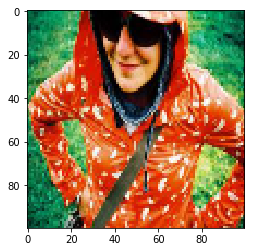

  'suit, suit of clothes   'coat


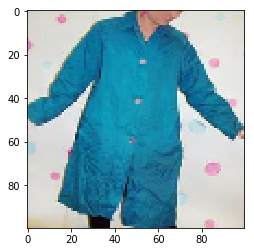

  'jacket   'coat


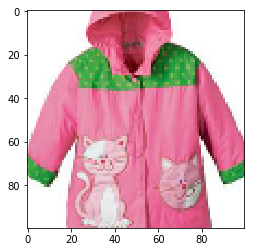

  'jacket   'coat


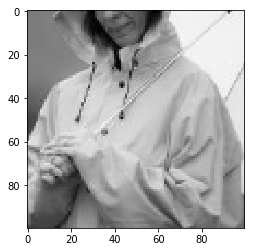

  'long dress   'coat


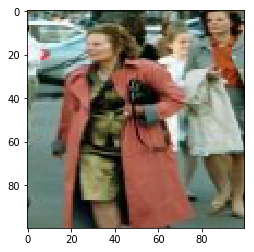

  'robe   'coat


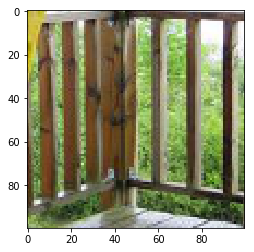

  'suit, suit of clothes   'coat


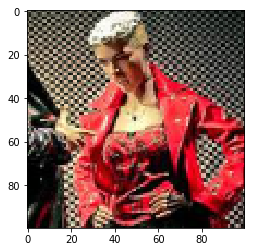

  'robe   'coat


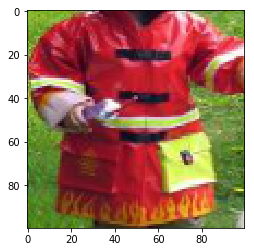

  'jacket   'coat


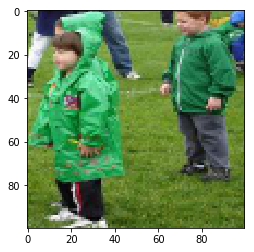

 'uniform   'coat


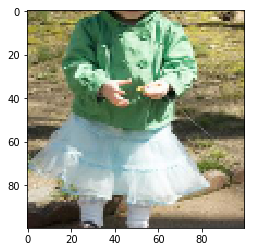

 'sweater   'coat


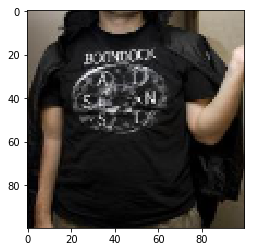

 'sweater   'coat


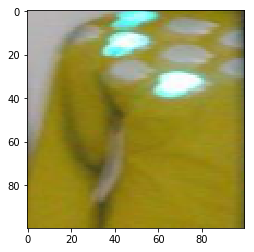

  'robe   'coat


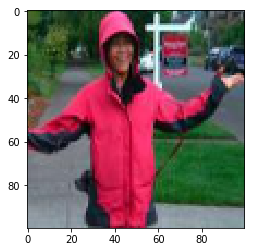

  'jacket   'coat


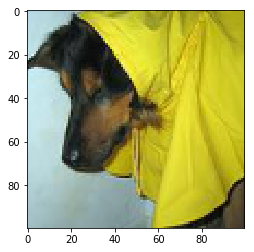

 'uniform   'coat


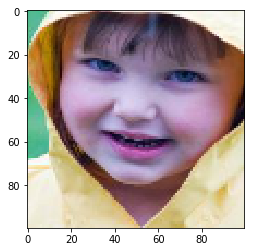

  'short dress   'coat


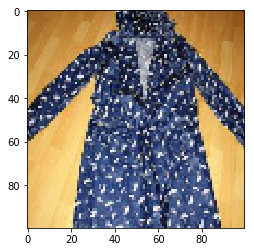

 'sweater   'coat


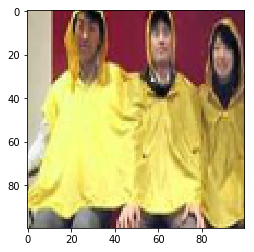

  'cloak   'coat


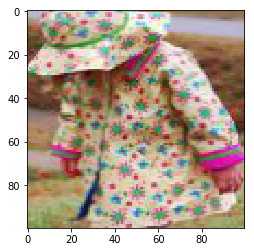

  'robe   'coat


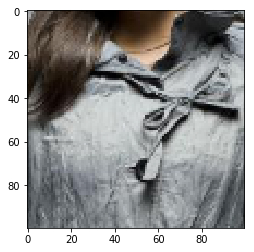

  'long dress   'coat


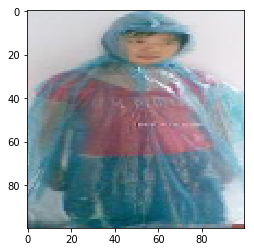

  'long dress   'coat


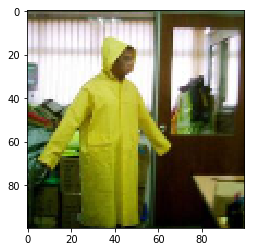

  'jacket   'coat


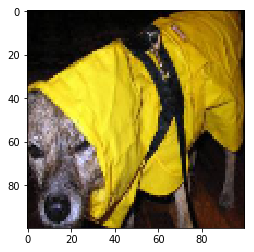

  'long dress   'coat


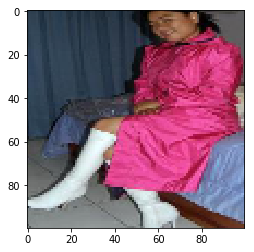

  'long dress   'coat


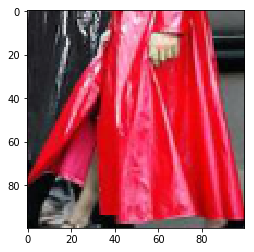

  'jacket   'coat


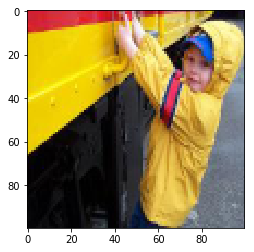

  'long dress   'coat


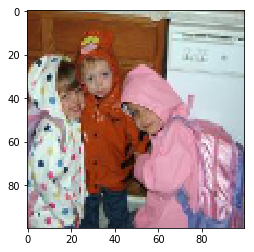

  'cloak   'coat


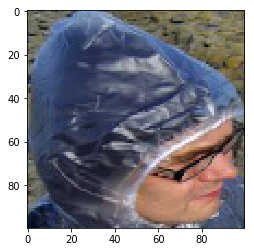

  'long dress   'coat


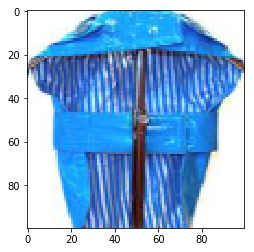

 'uniform   'coat


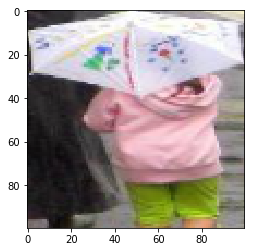

  'robe   'coat


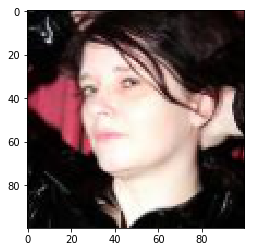

  'jacket   'coat


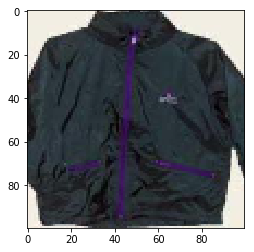

 'undergarment, upper body   'coat


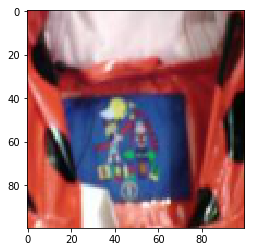

  'jacket   'coat


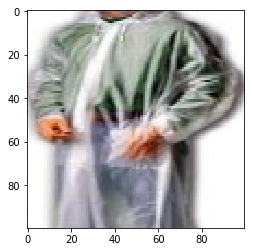

  'robe   'coat


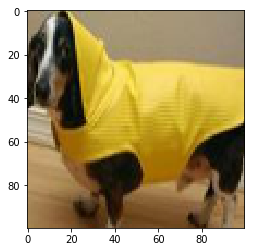

  'long dress   'coat


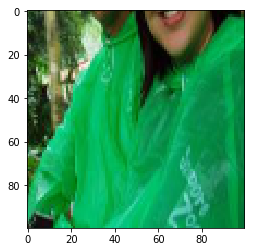

  'long dress   'coat


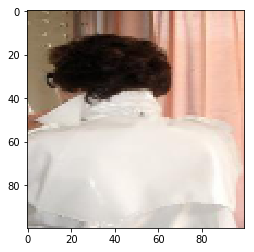

  'long dress   'coat


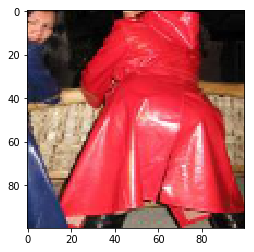

  'jacket   'coat


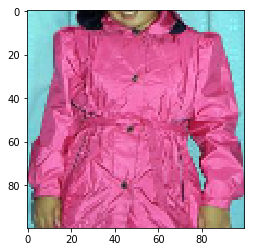

  'jacket   'coat


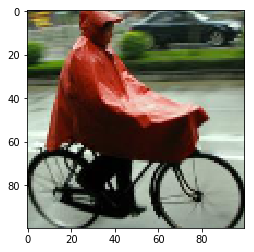

 'undergarment, upper body   'coat


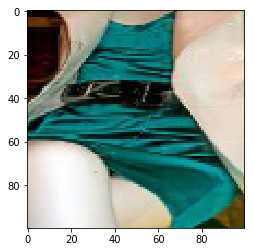

  'long dress   'coat


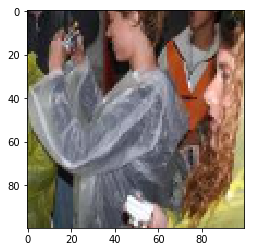

  'suit, suit of clothes   'coat


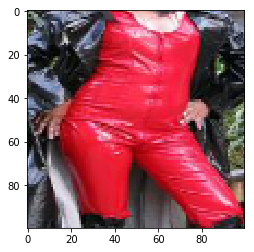

 'undergarment, upper body   'coat


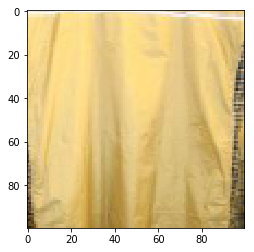

  'robe   'coat


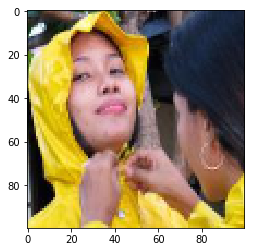

 'undergarment, upper body   'coat


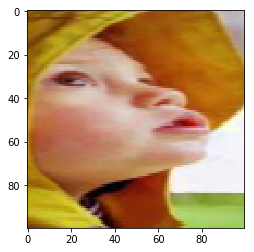

  'suit, suit of clothes   'coat


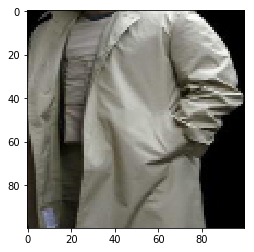

  'jacket   'coat


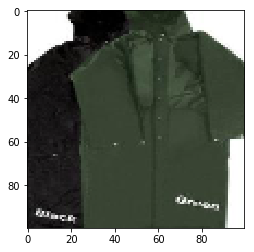

  'long dress   'coat


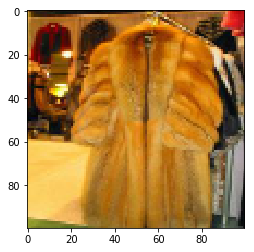

 'uniform   'coat


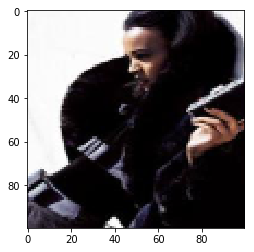

  'suit, suit of clothes   'coat


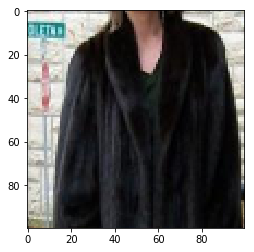

  'jacket   'coat


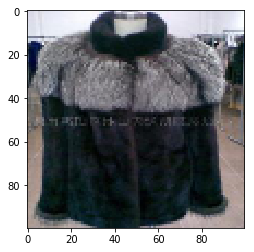

  'jacket   'coat


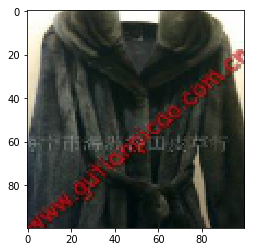

  'jacket   'coat


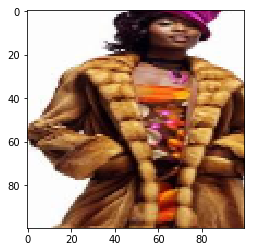

  'cloak   'coat


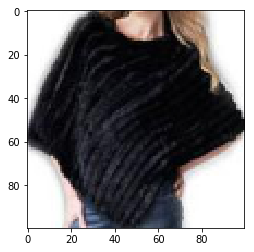

  'robe   'coat


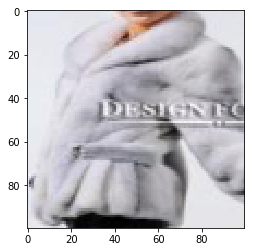

  'jacket   'coat


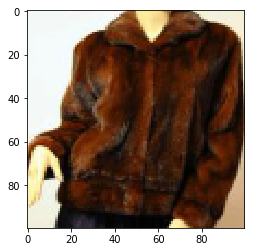

  'suit, suit of clothes   'coat


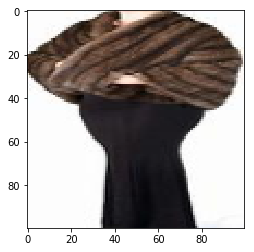

  'jacket   'coat


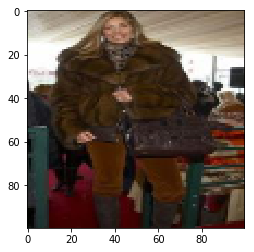

  'suit, suit of clothes   'coat


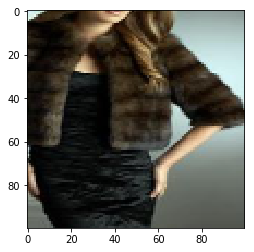

  'short dress   'coat


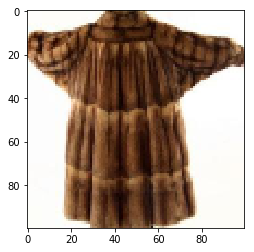

  'long dress   'coat


KeyboardInterrupt: 

In [60]:
for i in range(2000,2500):
    plt.imshow(testing_data[wrong_class_samples[i][0]][0])
    print(labels_dict[wrong_class_samples[i][1]],wrong_class_samples[i][2])
    plt.show()

In [24]:
model_final.save('model_new_5_train_VGG_5_epoch')

# Analysis

In [29]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

In [30]:
testing_data[0][1]

array([[1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])

In [36]:
#y_pred = model_final.predict_classes(X_predict)
(ans.argmax(1))
test_labels=[testing_data[i][1] for i in range(len(testing_data))]
len(test_labels)

17858

In [37]:
np.save('2_true_model_5_train_VGG_5_epoch_new', test_labels)
np.save('2_pred_model_5_train_VGG_5_epoch_new', ans)

In [83]:
a=np.load('2_true.npy')

In [89]:
a[0][1]

array([[0.],
       [1.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.],
       [0.]])

In [34]:
training_data_labels=[training_data[i][1] for i in range(len(training_data))]

In [35]:
np.array(training_data_labels).sum(axis=0)

array([[  896.],
       [ 7061.],
       [ 9061.],
       [ 9366.],
       [10090.],
       [  780.],
       [ 5799.],
       [ 1425.],
       [ 4285.],
       [ 6054.],
       [ 5209.],
       [ 1426.],
       [ 5538.],
       [ 3353.],
       [  750.]])

In [32]:
np.array(test_labels).sum(axis=0)

array([[ 225.],
       [1777.],
       [2277.],
       [2353.],
       [2532.],
       [ 196.],
       [1463.],
       [ 359.],
       [1075.],
       [1519.],
       [1306.],
       [ 358.],
       [1389.],
       [ 841.],
       [ 188.]])